### Implementation of Mistic 
to our binary description of patient data

In [1]:
import os
starting_directory = os.getcwd()
print(os.getcwd())

/blue/ferrallm/mcremer/cardiac-amyloidosis


### libraries and dirrectories

In [2]:
#set dirrectory
import os
starting_directory = os.getcwd()

#helps when fetching the functions and classes from mistic  
# new_dirrectory = 'C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Shared-From-DrK/mistic_breast_cancer_example/mistic_breast_cancer_example'
new_dirrectory = '/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma'
os.chdir(new_dirrectory)



In [3]:
# Import packages/modules
import matplotlib.pyplot as plt   
plt.rcParams.update({'font.size': 8})

import numpy as np
import pandas as pd

from statistics import mean 
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from seaborn import clustermap, heatmap

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics.pairwise import rbf_kernel

# Import functions
from mistic_v1 import greedy_backward_selection, tuneSVM, compute_SV_feature_importance, compute_counterfactuals #, compute_SV_feature_contribution
from mistic_v1 import compute_SV_gradient_rank2, compute_SV_importance_rank, compute_SV_contribution_rank, compute_SV_decision_perturbation

In [4]:
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix
from sklearn.calibration import calibration_curve
from scipy.stats import pearsonr
from mistic_v1 import rank_items

class SV_combined_rank():

    def __init__(self,weight=0.5):
        self.weight = weight

    def compute(self,svc,X,y):
        contribution_rank = compute_SV_contribution_rank(svc,X,y)
        importance_rank = compute_SV_importance_rank(svc,X,y)

        consensus_rank = self.weight*contribution_rank + (1-self.weight)*importance_rank
        rank = rank_items(consensus_rank)
        
        return rank

class svc_score():

    def __init__(self, weight=0.5):
        self.weight = weight

    def score(self,svc,X,y):
        y_pred = svc.predict(X)
        
        tn, fp, fn, tp = confusion_matrix(y, y_pred).ravel()

        if (tp+fp) > 0:
            precision = tp/(tp+fp)
        else:
            precision = 0
            
        if (tp+fn) > 0:
            recall = tp/(tp+fn)
        else:
            recall = 0
        
        if (precision+recall) > 0:
            f1 = 2*precision*recall/(precision+recall)
        else:
            f1 = 0
            
        auc = roc_auc_score(y, svc.decision_function(X))
        score = self.weight*auc + (1-self.weight)*f1
            
        return pd.DataFrame(data={'f1': f1, 'auc': auc, 'score': score},index=[0])


In [5]:
import shap
from mistic_v1 import compute_SV_integrated_gradient

In [6]:
import plotly.express as px
from seaborn import pairplot, load_dataset

In [7]:
import numpy as np
import pickle

In [8]:
#some functions I wrote to help with exporting data
def outputToExcel(df_data, fileName_header, fileName_Common, fileName_suffix,
                  parent_dir, folderName, sheetName):
    fileName = fileName_header + fileName_Common + fileName_suffix
    outfile_extension = '.xlsx'
    outfile_boxplts = fileName + outfile_extension
    path_out= os.path.join(parent_dir, folderName, outfile_boxplts)

    if os.path.exists(path_out):
            #if old sheet
            with pd.ExcelWriter(path_out, mode = 'a', if_sheet_exists = 'overlay') as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True)
    else: 
            #new sheet
            with pd.ExcelWriter(path_out) as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True) #if new sheet
    
def outputFiguresPath(fileName_header, fileName_mid, fileName_suff, parent_dir, folderName):
        fileName_header = str(fileName_header)
        fileName_mid = str(fileName_mid)
        fileName_suff = str(fileName_suff)

        #cleaning the input to prevent addition of / to the directory
        fileName_header = fileName_header.replace("/", "-")
        fileName_mid = fileName_mid.replace("/", "-")
        fileName_suff = fileName_suff.replace("/", "-")

        fileName = fileName_header + fileName_mid +fileName_suff
        out_filename = fileName + '.tif'
        new_filepath = os.path.join(parent_dir, folderName, out_filename)
        #the output path can be used to save the figure
        return new_filepath
        # plt.savefig(new_filepath, bbox_inches = 'tight')

def makeFolderPathForData(parent_dir, folderName_header, folderName_common, folderName_suffix):
    #makes a new directory for your files
    #returns the folder name for use in other functions
    folderName = folderName_header + folderName_common + folderName_suffix
    path = os.path.join(parent_dir,folderName)
    if not os.path.exists(path):
        os.mkdir(path)
    return folderName

### importing our data

In [9]:
#consider changing dirrectory back to a space to save your data that isn't the mistic folder

# new_dirrectory = "C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/SVM_Mistic_Output_2024-07-12_v2"
# os.chdir(new_dirrectory)

#for file outputs
fileName_header = "AllLabs_240716_fitRed033" #what data did you put in
fileName_common = "_MisticOutput_" #what was performed on the data, for figures, this may be added to
fileName_suffix = "_2024-07-25_v1" #date and versioning

# saving_dirrectory = "C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/"
saving_dirrectory = "012 Processed Data"
makingFolder = makeFolderPathForData(parent_dir= saving_dirrectory, folderName_header= "SVM_Mistic_Output_AllLabs_033FitRed", folderName_common= "2024-07-25_", 
                                     folderName_suffix= "v1")
dataFrameFolderOut =  makingFolder #"SVM_Mistic_Output_2024-07-19_v2"
pickleFolderOut = makingFolder

figDirectory = "012 Processed Data"
figFolder = makingFolder #"SVM_Mistic_Output_2024-07-19_v2"



In [10]:
#file name for inputs
#file full with directory
# fileInput_directory = "C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/DFsForSVM_2024-07-12_v1/AL-KnownPts-top38labs-wFill-tx-Summary-One_2024-07-12_v1.xlsx"
fileInput_directory = 'AL-KnownPts-labsAll-wFill-tx-Summary-One_2024-07-16_v1.xlsx'

In [11]:
# # Import dataset

dataTable = pd.read_excel(fileInput_directory, header = 0)
dataTable

,DeID,Amyloid Status,Dx,Sex,Age,Survival (in months),time from diagnosis to first echo (months),1st_EF(avg%),1st_Diastolic grade,1st_BSA,...,ChemoTx,ChemoTx Number,ImmunoTx,ImmunoTx Number,HemeTx,HemeTx Number,RadTx,RadTx Number,OtherTx,OtherTx Number
0,B-02,2,1,0,48,9.466667,4.433333,67.5,1,1.80,...,0,0,0,0,0,0,0,0,0,0
1,C-03,2,2,1,59,17.000000,-0.033333,62.5,2,1.73,...,1,2,0,0,0,0,0,0,0,0
2,E-01,2,1,0,50,71.300000,21.666667,62.0,0,2.17,...,0,0,0,0,0,0,0,0,0,0
3,E-02,2,1,0,64,20.466667,2.100000,60.0,1,-1.00,...,0,0,0,0,0,0,0,0,0,0
4,F-03,2,2,0,61,52.000000,-1.000000,-1.0,-1,-1.00,...,1,4,0,0,1,1,0,0,0,0
5,G-01,2,2,0,70,104.000000,102.166667,55.0,2,-1.00,...,0,0,1,1,0,0,0,0,0,0
6,G-02,2,2,1,36,30.000000,4.400000,50.0,3,2.12,...,0,0,0,0,0,0,0,0,0,0
7,I-01,2,2,1,55,33.000000,1.133333,62.5,1,1.99,...,1,4,1,2,0,0,0,0,0,0
8,I-03,2,1,0,67,10.033333,1.633333,57.5,1,1.99,...,0,0,0,0,0,0,0,0,0,0
9,J-02,2,2,1,68,26.000000,0.900000,47.5,-1,1.56,...,1,1,1,1,0,0,0,0,0,0


In [12]:
#columns to drop from the x data (samples and features)
x_columns_toDrop = ['DeID', 'Amyloid Status']


#columns to use for the y data 
y_column_Classification = 'Amyloid Status'

### scale data

In [13]:
# Scale input X
X = dataTable.copy()
X.drop(columns= x_columns_toDrop,inplace=True)
scaler = StandardScaler()
scaler.fit(X) #computes the mean and STD along the features axis

X_train_all = scaler.transform(X) #standardization by centering and scaling
y_train_all = dataTable[y_column_Classification]
X_train_all

array([[-0.74270874, -0.77459667, -1.52139307, ..., -0.14586499,
        -0.20851441, -0.20851441],
       [ 0.8072921 ,  1.29099445, -0.40879537, ..., -0.14586499,
        -0.20851441, -0.20851441],
       [-0.74270874, -0.77459667, -1.31910258, ..., -0.14586499,
        -0.20851441, -0.20851441],
       ...,
       [-0.74270874, -0.77459667,  0.90609283, ..., -0.14586499,
        -0.20851441, -0.20851441],
       [ 0.8072921 , -0.77459667, -0.40879537, ..., -0.14586499,
        -0.20851441, -0.20851441],
       [-2.29270958,  1.29099445,  0.90609283, ..., -0.14586499,
        -0.20851441, -0.20851441]])

In [14]:
#pickling the test and train sets 
pickle_file_name = 'X_train_all_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(X_train_all, pickle_file)

pickle_file_name = 'y_train_all_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(y_train_all, pickle_file)

In [15]:
#pickling the scalar so that new data can be applied and mapped to use this classifier
pickle_file_name = 'scaler_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(scaler, pickle_file)

In [16]:
# # loading from pickled objects
# #to upload a pickled set use this block
# pickle_file_name = 'X_train_all_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# X_train_all = pickle.load(pickle_file)

# #uploading the y train object
# pickle_file_name = 'y_train_all_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# y_train_all = pickle.load(pickle_file)

### creating the classifier

In [17]:
# Number of training sets
NT = 5 

# Data split ratio
val_size = 1/NT

#Feature selection reduction factor
red_factor = 0.33

In [18]:
# split train set into train and test(val) data / repeat NT times and |get NT number of datsets
CV_sets = []
for i in range(NT):
    X_train, X_test, y_train, y_test = train_test_split(X_train_all, y_train_all, 
                                                        stratify = y_train_all, 
                                                        random_state= i, 
                                                        test_size= val_size)
    
    CV_set = {"train": {"X": X_train,"y": y_train}, "test":  {"X": X_test, "y": y_test}} 
    CV_sets.append(CV_set)

In [19]:
#pickling the CV sets object
pickle_file_name = 'CV_sets_object_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(CV_sets, pickle_file)

In [20]:
# #to upload a pickled set use this block
# pickle_file_name = 'CV_sets_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# CV_sets = pickle.load(pickle_file)

In [21]:
C_range = [2**x for x in range(-2,5)] # trade-off between margin and misclassifications.  smaller c, wider margins
gamma_range = [2**x for x in range(-9,1)]

svc = SVC(kernel = 'rbf', class_weight="balanced", probability=False)

In [22]:
#create tesTune, the first classifier using all the features

In [23]:
tesTune = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range)
tesTune["best_params"]

,c,g,f1,auc,score
0,0.25,1,0.666667,0.5,0.583333


In [24]:
#saving the first test tune set
perf = tesTune["performance"]
tesTune_best_params = tesTune["best_params"]

outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "tesTune perf")
outputToExcel(df_data=tesTune_best_params, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "tesTune best params")

In [25]:
#pickling the tesTune object
pickle_file_name = 'tesTune_object_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(tesTune, pickle_file)

In [26]:
# #to upload a pickled set use this block
# pickle_file_name = 'tesTune_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# tesTune = pickle.load(pickle_file)

In [27]:
tesTune["best_models"][0].classes_

array([1, 2])

## greedy_backward_selection

featRank_A fresh compile

In [28]:
featRank_A = greedy_backward_selection(svc, X_train_all, CV_sets, compute_SV_importance_rank, svc_score().score, C_range, gamma_range, redF = red_factor)

      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    7833      19.0
      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    5248      19.0
      c  g        f1   auc     score  nFeats  mean_nSV
0  0.25  1  0.628571  0.46  0.544286    3516      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.553333  0.528  0.540667    2355      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.832828  0.856  0.844414    1577      19.0
      c    g        f1    auc    score  nFeats  mean_nSV
0  0.25  0.5  0.868081  0.884  0.87604    1056      19.0
    c        g        f1    auc     score  nFeats  mean_nSV
0  16  0.03125  0.810816  0.864  0.837408     707      19.0
      c  g        f1   auc     score  nFeats  mean_nSV
0  0.25  1  0.696703  0.66  0.678352     473      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.

In [29]:
#if not already pickled use this block
pickle_file_name = 'featRankA_object_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_A, pickle_file)



In [30]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_A["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_A["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_A["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A best features")

df_bestModels= pd.DataFrame(featRank_A["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_A["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A feature rank")

featRank_A upload from pickle

In [31]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankA_object_' + fileName_header +fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_A = pickle.load(pickle_file)

compile featRank_B 

In [32]:
featRank_B = greedy_backward_selection(svc, X_train_all, CV_sets, compute_SV_contribution_rank, svc_score().score, C_range, gamma_range, redF = red_factor)

      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    7833      19.0
      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    5248      19.0
      c  g        f1   auc     score  nFeats  mean_nSV
0  0.25  1  0.628571  0.46  0.544286    3516      19.0
   c         g        f1   auc     score  nFeats  mean_nSV
0  1  0.001953  0.586667  0.64  0.613333    2355      19.0
   c         g       f1   auc     score  nFeats  mean_nSV
0  1  0.001953  0.60671  0.68  0.643355    1577      19.0
      c         g        f1   auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.630956  0.52  0.575478    1056      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.693077  0.704  0.698538     707      19.0
      c         g        f1   auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.793867  0.84  0.816934     473      19.0
   c         g        f1   auc     score  nFeats  mean_nSV
0  1  0.00781

In [33]:
pickle_file_name = 'featRankB_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_B, pickle_file)

In [34]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_B["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_B["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_B["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B best features")

df_bestModels= pd.DataFrame(featRank_B["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_B["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B feature rank")

load featRank_B from pickle

In [35]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankB_object_' + fileName_header +fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_B = pickle.load(pickle_file)

compile featRank_C

In [36]:
featRank_C = greedy_backward_selection(svc, X_train_all, CV_sets, SV_combined_rank(weight=0.25).compute, svc_score().score, C_range, gamma_range, redF = red_factor)

      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    7833      19.0
      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    5248      19.0
      c  g        f1   auc     score  nFeats  mean_nSV
0  0.25  1  0.628571  0.46  0.544286    3516      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.553333  0.536  0.544667    2355      19.0
      c         g       f1    auc     score  nFeats  mean_nSV
0  0.25  0.003906  0.81101  0.856  0.833505    1577      19.0
   c  g        f1    auc     score  nFeats  mean_nSV
0  2  1  0.885859  0.892  0.888929    1056      19.0
   c    g        f1    auc     score  nFeats  mean_nSV
0  2  0.5  0.835758  0.876  0.855879     707      19.0
      c    g        f1   auc     score  nFeats  mean_nSV
0  0.25  0.5  0.810816  0.78  0.795408     473      19.0
      c    g        f1   auc     score  nFeats  mean_nSV
0  0.25  0.5  0.810816  0.78  0.795408     

In [37]:
pickle_file_name = 'featRankC_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_C, pickle_file)

In [38]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_C["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_C["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_C["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C best features")

df_bestModels= pd.DataFrame(featRank_C["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_C["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C feature rank")

upload featRank_C from pickle

In [39]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankC_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_C = pickle.load(pickle_file)

compile featRank_D

In [40]:
featRank_D = greedy_backward_selection(svc, X_train_all, CV_sets, SV_combined_rank(weight=0.5).compute, svc_score().score, C_range, gamma_range, redF = red_factor)

      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    7833      19.0
      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    5248      19.0
      c  g        f1   auc     score  nFeats  mean_nSV
0  0.25  1  0.628571  0.46  0.544286    3516      19.0
      c         g        f1  auc    score  nFeats  mean_nSV
0  0.25  0.001953  0.617619  0.6  0.60881    2355      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.584286  0.704  0.644143    1577      19.0
      c         g        f1   auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.769336  0.88  0.824668    1056      19.0
      c         g       f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.81101  0.896  0.853505     707      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.792929  0.864  0.828465     473      19.0
     c         g        f1   auc     score  nFeats  me

In [41]:
pickle_file_name = 'featRankD_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_D, pickle_file)

In [42]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_D["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_D["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_D["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D best features")

df_bestModels= pd.DataFrame(featRank_D["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_D["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D feature rank")

In [43]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankD_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_D = pickle.load(pickle_file)

comple featRank_E

In [44]:
featRank_E = greedy_backward_selection(svc, X_train_all, CV_sets, SV_combined_rank(weight=0.75).compute, svc_score().score, C_range, gamma_range, redF = red_factor)

      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    7833      19.0
      c  g        f1  auc     score  nFeats  mean_nSV
0  0.25  1  0.666667  0.5  0.583333    5248      19.0
      c  g        f1   auc     score  nFeats  mean_nSV
0  0.25  1  0.628571  0.46  0.544286    3516      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.614444  0.648  0.631222    2355      19.0
   c         g        f1   auc     score  nFeats  mean_nSV
0  1  0.001953  0.614444  0.68  0.647222    1577      19.0
   c         g        f1   auc     score  nFeats  mean_nSV
0  1  0.001953  0.625758  0.64  0.632879    1056      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.738889  0.784  0.761444     707      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.822222  0.872  0.847111     473      19.0
      c         g        f1   auc     score  nFeats  mean_nSV
0  0

In [45]:
pickle_file_name = 'featRankE_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_E, pickle_file)

In [46]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_E["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_E["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_E["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E best features")

df_bestModels= pd.DataFrame(featRank_E["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_E["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E feature rank")

In [47]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankE_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_E = pickle.load(pickle_file)

### Performance Plots

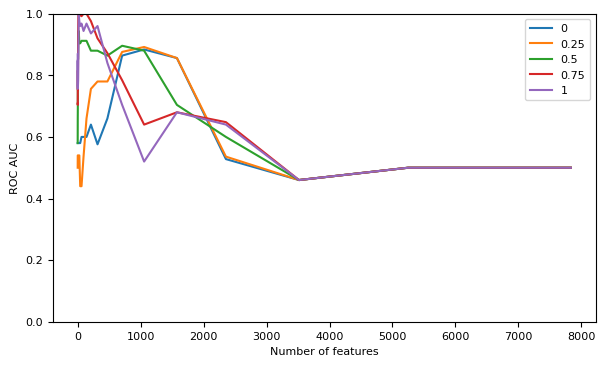

In [48]:
fig, ax = plt.subplots(1,1, figsize=(7, 4))
plt.plot(featRank_A["performance"].nFeats, featRank_A["performance"].auc) 
plt.plot(featRank_C["performance"].nFeats, featRank_C["performance"].auc) 
plt.plot(featRank_D["performance"].nFeats, featRank_D["performance"].auc) 
plt.plot(featRank_E["performance"].nFeats, featRank_E["performance"].auc)
plt.plot(featRank_B["performance"].nFeats, featRank_B["performance"].auc) 

plt.ylim(0,1)

plt.legend(['0','0.25','0.5','0.75','1'])
plt.ylabel('ROC AUC')
plt.xlabel('Number of features')
plt.show()

#saving figure
figCommon = fileName_common + "fig1"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# plt.tight_layout()
fig.savefig(figPath, bbox_inches = 'tight')

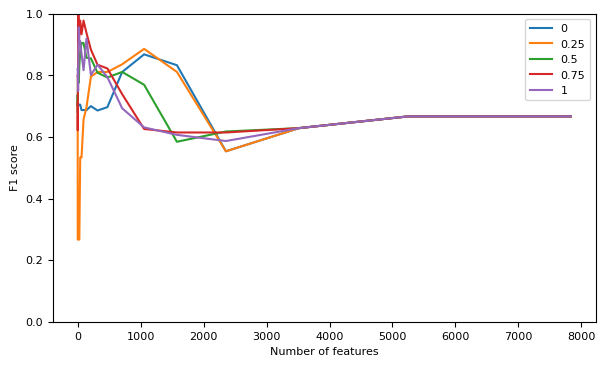

In [49]:
fig, ax = plt.subplots(1,1, figsize=(7, 4))
plt.plot(featRank_A["performance"].nFeats, featRank_A["performance"].f1) 
plt.plot(featRank_C["performance"].nFeats, featRank_C["performance"].f1) 
plt.plot(featRank_D["performance"].nFeats, featRank_D["performance"].f1) 
plt.plot(featRank_E["performance"].nFeats, featRank_E["performance"].f1) 
plt.plot(featRank_B["performance"].nFeats, featRank_B["performance"].f1) 

plt.ylim(0,1)

plt.legend(['0','0.25','0.5','0.75','1'])
plt.ylabel('F1 score')
plt.xlabel('Number of features')
plt.show()

#saving figure
figCommon = fileName_common + "fig2"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

### Input the top 3 features from your data set into the following plot for a 3D visualization

In [50]:
X.columns[featRank_D["sorted"].astype(int)]

Index(['RadTx Number', 'Testosterone Result Exp2 Force RegresDesc std',
       'Albumin Electrophoresis Result Desc max',
       'Testosterone Result Desc count', '1st_LVH',
       'Atypical Lymphocyte Result Exp2 Force R2',
       'Pct. Plasmacyte Result Linear Forced residual error',
       'Serum Electrophoresis Alpha 2 Result Desc std',
       'Pct. Plasmacyte Result Linear Forced R2',
       'Sodium Result(mmol/L) Desc max',
       ...
       'Urinalysis M Spike Result Linear NotForced RegresDesc min',
       'Urinalysis M Spike Result Linear NotForced RegresDesc std',
       'Urinalysis M Spike Result Linear NotForced RegresDesc mean',
       'Urinalysis M Spike Result Linear NotForced RegresDesc count',
       'Urinalysis M Spike Percent Result Linear NotForced RegresDesc max',
       'Urinalysis M Spike Percent Result Linear NotForced RegresDesc 75%',
       'Urinalysis M Spike Percent Result Linear NotForced RegresDesc 50%',
       'Urinalysis M Spike Percent Result Linear Not

In [51]:
listX = list(X.columns[featRank_D["sorted"].astype(int)])

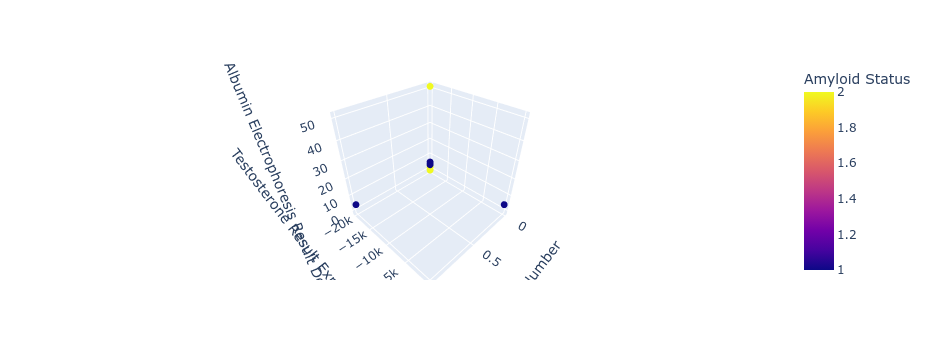

In [52]:
fig = px.scatter_3d(dataTable, x=listX[0], y=listX[1], z=listX[2],
              color= y_column_Classification)
fig.update_traces(marker_size = 4)
fig.show()

### performance outputs
set the number of features you want to check the performance with

In [53]:
#setting number of features for performance test
fold = 0
number_feat_perf_test = 25 #describes for testing performance 
numb_features_figures = 5 #number of features to use in plots

In [54]:
# queryText = "nFeats == " + str(number_feat_perf_test)
# featRank_B["performance"].query(queryText)

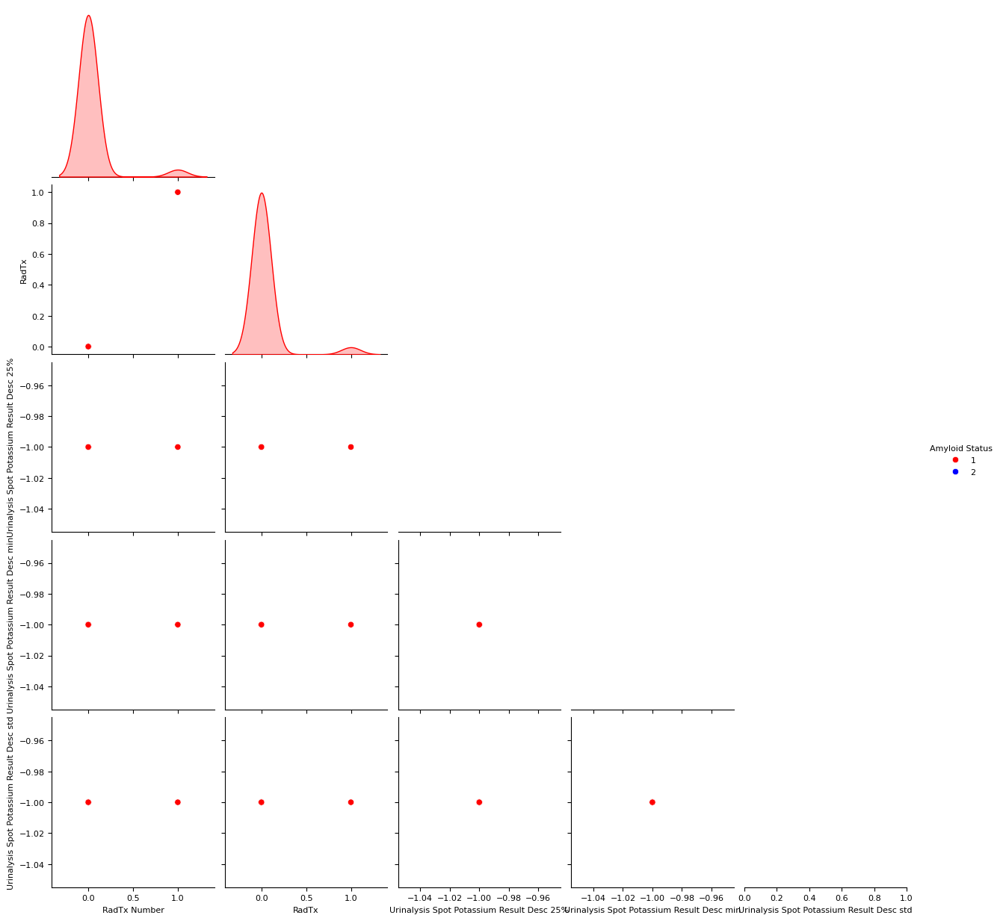

In [55]:
palette = {np.int64(1) :'red', np.int64(2): 'blue'} #our data is of int64
featuresToPlot = list(X.columns[featRank_A["sorted"].astype(int)][0:numb_features_figures])
featuresToPlot.extend([y_column_Classification]) #must include the final classification column 

fig = pairplot(dataTable[featuresToPlot],hue= y_column_Classification, corner=True, palette=palette)
# fig.title("featRank_A compare features")

figCommon = fileName_common + "featRankA"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

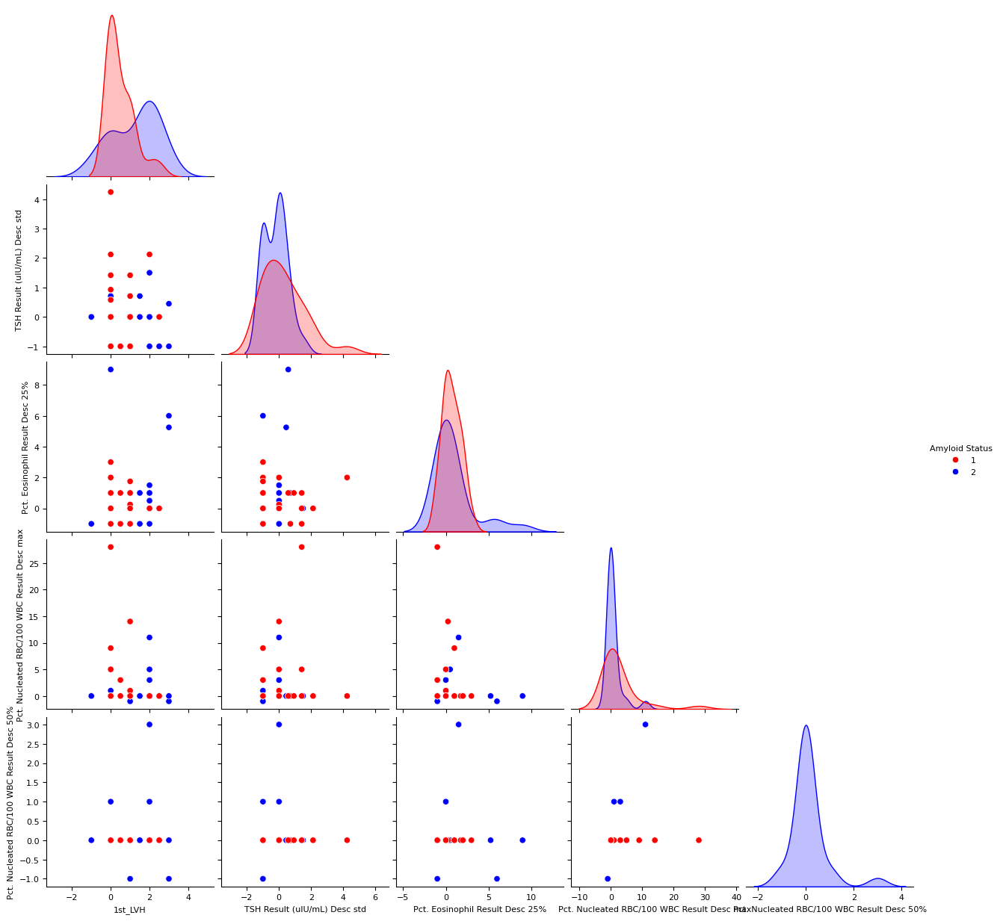

In [56]:
palette = {np.int64(1) :'red', np.int64(2): 'blue'} #our data is of int64
featuresToPlot = list(X.columns[featRank_B["sorted"].astype(int)][0:numb_features_figures])
featuresToPlot.extend([y_column_Classification]) #must include the final classification column 

fig = pairplot(dataTable[featuresToPlot],hue= y_column_Classification, corner=True, palette=palette)
# fig.title("featRank_A 5 features", loc = 'center')

figCommon = fileName_common + "featRankB_5"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

In [57]:
# queryText = "nFeats == " + str(number_feat_perf_test)
# featRank_E["performance"].query(queryText)

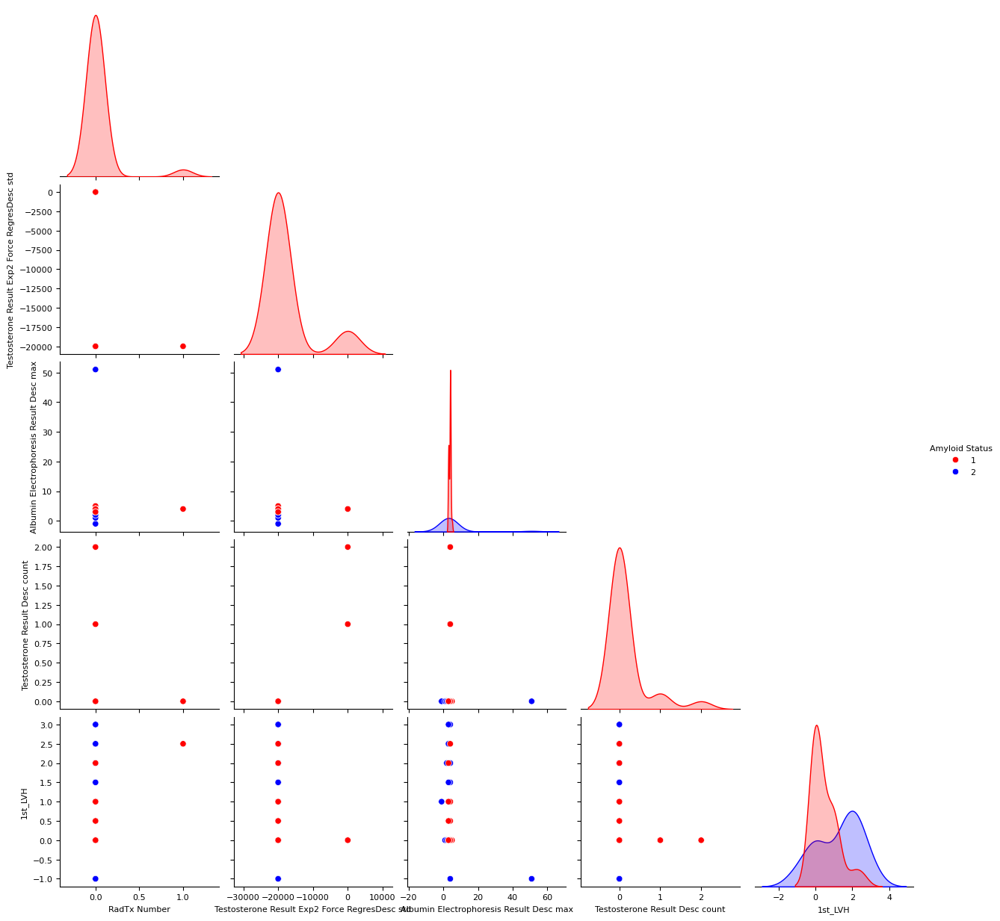

In [58]:
palette = {np.int64(1) :'red', np.int64(2): 'blue'} #our data is of int64
featuresToPlot = list(X.columns[featRank_D["sorted"].astype(int)][0:numb_features_figures])
featuresToPlot.extend([y_column_Classification]) #must include the final classification column 

fig = pairplot(dataTable[featuresToPlot],hue= y_column_Classification, corner=True, palette=palette)
# fig.title("featRank_A 5 features", loc = 'center')

figCommon = fileName_common + "featRankD_5"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

In [59]:
# pairplot(dataTable[['Area worst', 'Concave Points worst', 'Texture worst','Diagnosis']],hue="Diagnosis", corner=True, palette={"M":"red","B":"blue"})

In [60]:
# tesTune2 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range,feature_index=featRank_D["sorted"][0:10].astype(int))
# tesTune2["best_params"]

## to use best features from a feature selection process

In [61]:
modelD_Features = featRank_D["best_features"] #to get the best features which take highest score and highest C
modelD_FeaturesInt = featRank_D["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelD_numbFeatures = len(modelD_FeaturesInt) #number of features

#list of column names
modelD_FeaturesIntList = X.columns[featRank_D["best_features"].astype(int)]

In [62]:
modelE_Features = featRank_E["best_features"] #to get the best features which take highest score and highest C
modelE_FeaturesInt = featRank_E["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelE_numbFeatures = len(modelE_FeaturesInt) #number of features

#list of column names
modelE_FeaturesIntList = X.columns[featRank_E["best_features"].astype(int)]

In [63]:
modelB_Features = featRank_B["best_features"] #to get the best features which take highest score and highest C
modelB_FeaturesInt = featRank_B["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelB_numbFeatures = len(modelB_FeaturesInt) #number of features

#list of column names
modelB_FeaturesIntList = X.columns[featRank_B["best_features"].astype(int)]

In [64]:
# print("features model D: ", modelD_Features)
# print("features model D type: ", type(modelD_Features))
# print("featuresInt model D: ", modelD_FeaturesInt)
# print("featuresInt model D type: ", type(modelD_FeaturesInt))
# print("model D numbFeatures: ", modelD_numbFeatures)
# print("type of numbFeatures: ", type(modelD_numbFeatures))
# print("model D modelD_FeaturesIntList: ", modelD_FeaturesIntList)
# print("type of modelD_FeaturesIntList: ", type(modelD_FeaturesIntList))

In [65]:
# print(X.columns[featRank_D["best_features"].astype(int)])

## Figures for weighting 0.5

In [66]:
#creation of tesTune_05
tesTune05 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range,feature_index=modelD_FeaturesInt)
print(tesTune05["best_params"])

    c         g        f1    auc     score
0  16  0.001953  0.905051  0.912  0.908525


In [67]:
#pickling of tesTune_05

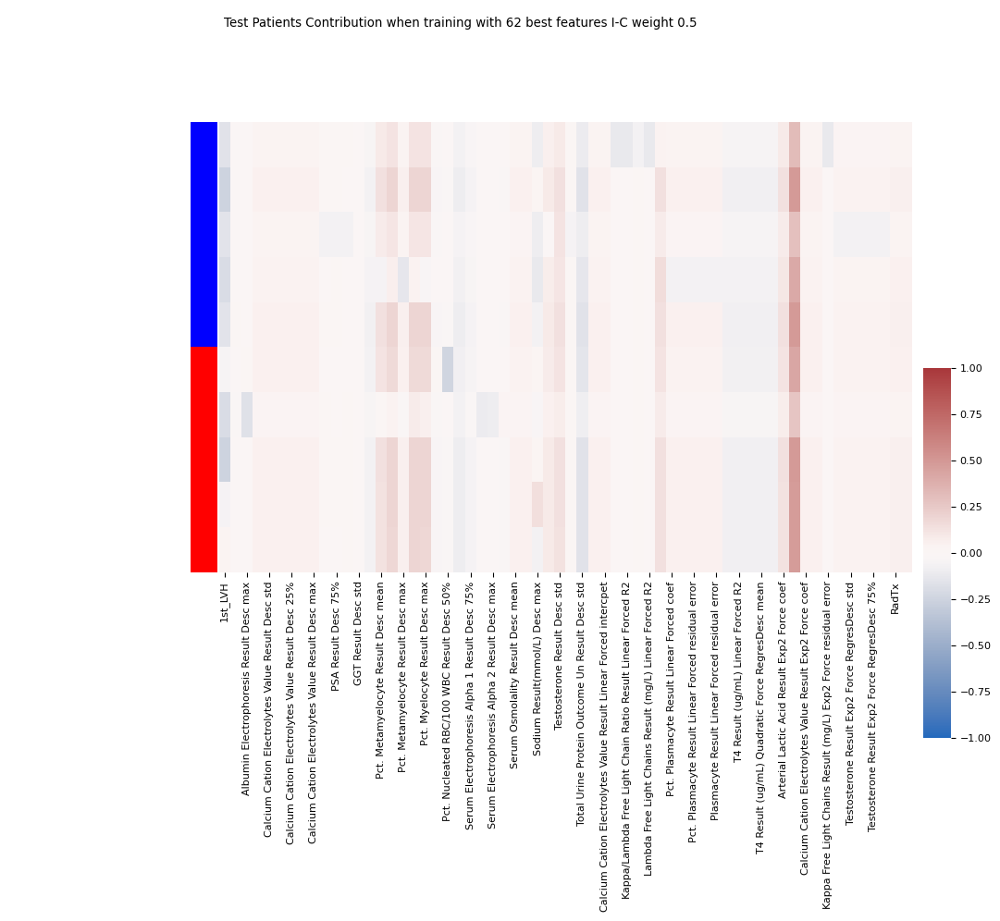

In [68]:
feat_contribution = compute_SV_decision_perturbation(tesTune05["best_models"][fold],CV_sets[fold]["test"]["X"][:,modelD_FeaturesInt])
FItable = pd.DataFrame(feat_contribution, index=CV_sets[fold]["test"]["y"],columns=X.columns[modelD_FeaturesInt])

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:], 
           yticklabels=False,
           cmap="vlag", vmin=-1, vmax=1,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets[0]["test"]["y"].values[np.argsort(CV_sets[fold]["test"]["y"].values)]])
plt.suptitle("Test Patients Contribution when training with "+  str(modelD_numbFeatures)+ " best features I-C weight 0.5")

figCommon = fileName_common + "fig3_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

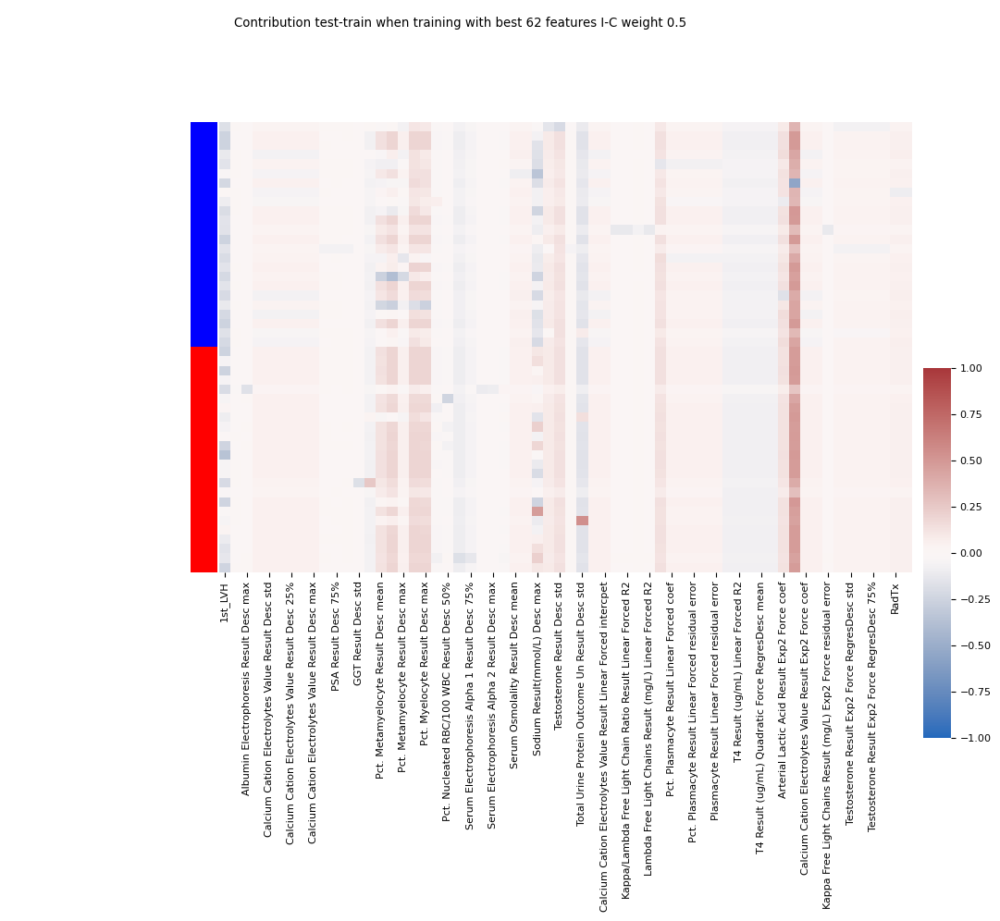

In [69]:
CV_sets_trainANDtest_X = np.concatenate((CV_sets[fold]["train"]["X"][:,modelD_FeaturesInt],CV_sets[fold]["test"]["X"][:,modelD_FeaturesInt]), axis =0)
CV_sets_trainANDtest_y = np.concatenate((CV_sets[fold]["train"]["y"],CV_sets[fold]["test"]["y"]), axis = 0)

feat_contribution = compute_SV_decision_perturbation(tesTune05["best_models"][fold],CV_sets_trainANDtest_X)
FItable = pd.DataFrame(feat_contribution, index=CV_sets_trainANDtest_y,columns=X.columns[modelD_FeaturesInt])

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           cmap="vlag", vmin=-1, vmax=1,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Contribution test-train when training with best "+  str(modelD_numbFeatures)+ " features I-C weight 0.5")

figCommon = fileName_common + "fig3_2_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

In [70]:
# # import shap
# # from mistic_v1 import compute_SV_integrated_gradient

# # fold = 0
# # number_feat_perf_test = 25
# tesTune2 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range,feature_index=featRank_D["sorted"][0:number_feat_perf_test].astype(int))
# print(tesTune2["best_params"])

# feat_contribution = compute_SV_decision_perturbation(tesTune2["best_models"][fold],CV_sets[fold]["test"]["X"][:,featRank_D["sorted"][0:number_feat_perf_test].astype(int)])
# FItable = pd.DataFrame(feat_contribution, index=CV_sets[fold]["test"]["y"],columns=X.columns[featRank_D["sorted"][0:number_feat_perf_test].astype(int)])

# FItable.reset_index(drop=True, inplace=True)
# fig = clustermap(FItable.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:], 
#            yticklabels=False,
#            cmap="vlag", vmin=-1, vmax=1,
#            #row_linkage=hcRow, col_linkage=hcCol, 
#            row_cluster=False,col_cluster=False,
#            cbar_pos=(1, .2, .03, .4),
#            row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets[0]["test"]["y"].values[np.argsort(CV_sets[fold]["test"]["y"].values)]])
# plt.suptitle("Contribution when Training with "+  str(number_feat_perf_test)+ " Features from featRank_D")

# figCommon = fileName_common + "fig3"
# figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

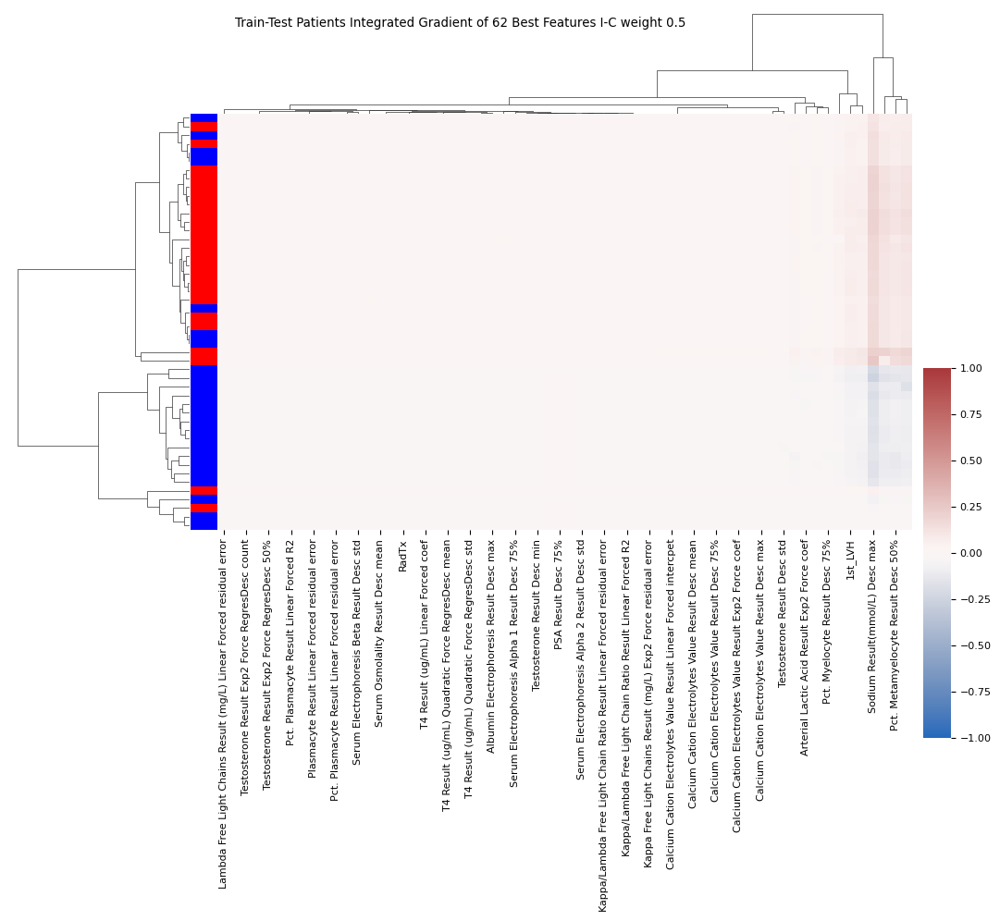

In [71]:
# CV_sets_trainANDtest_X = np.concatenate((CV_sets[fold]["train"]["X"][:,modelD_FeaturesInt],CV_sets[fold]["test"]["X"][:,modelD_FeaturesInt]), axis =0)
# CV_sets_trainANDtest_y = np.concatenate((CV_sets[fold]["train"]["y"],CV_sets[fold]["test"]["y"]), axis = 0)

IG = compute_SV_integrated_gradient(tesTune05["best_models"][fold], CV_sets_trainANDtest_X)

IGtable = pd.DataFrame(IG,columns=X.columns[modelD_FeaturesInt])

fig = clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-1, vmax=1,
           #row_linkage=hcRow, col_linkage=hcCol, 
           cbar_pos=(1, .2, .03, .4),
        #    row_colors=[["red","blue"][int(l=="B")+0] for l in CV_sets[0]["test"]["y"].values]
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y])
plt.suptitle("Train-Test Patients Integrated Gradient of "+  str(modelD_numbFeatures)+ " Best Features I-C weight 0.5")
plt.show()

figCommon = fileName_common + "fig4_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

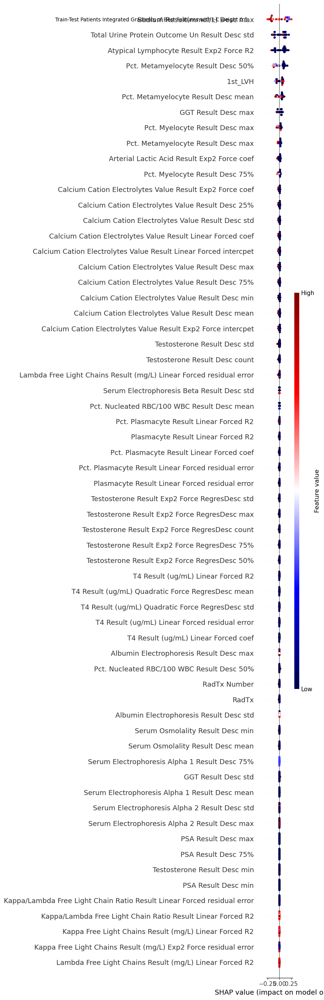

In [72]:
# number_feat_perf_test = 25
fig = shap.summary_plot(IG,  CV_sets_trainANDtest_X, max_display=modelD_numbFeatures , 
                  feature_names=X.columns[modelD_FeaturesInt],cmap="seismic", show = False)
plt.suptitle("Train-Test Patients Integrated Gradients of Best Features with I-C weight 0.5")
figCommon = fileName_common + "fig5_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

### update: 
update the below to iterate through the features if you wish.

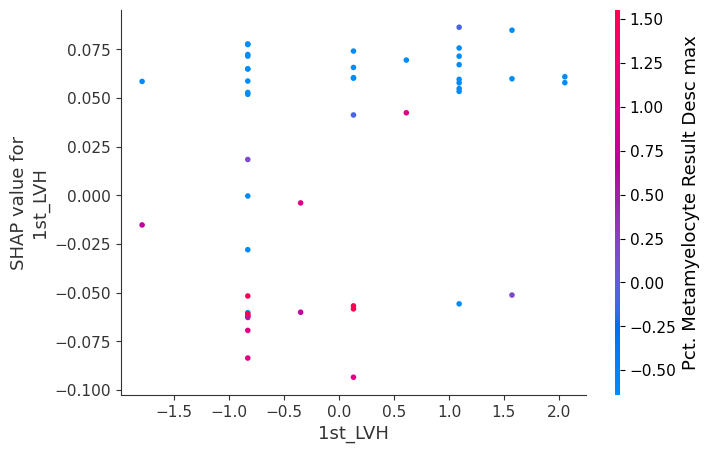

In [73]:
Xcv = pd.DataFrame(CV_sets_trainANDtest_X, 
                     index=CV_sets_trainANDtest_y,
                     columns=X.columns[modelD_FeaturesInt])

fig6_feature_to_plot= modelD_FeaturesIntList[0]

shap.dependence_plot( fig6_feature_to_plot , IG, Xcv, show = False)

figCommon = fileName_common + "fig6_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

In [74]:
# np.argsort(CV_sets[fold]["test"]["y"].values)

In [75]:
# topFeaturesNumber = number_feat_perf_test

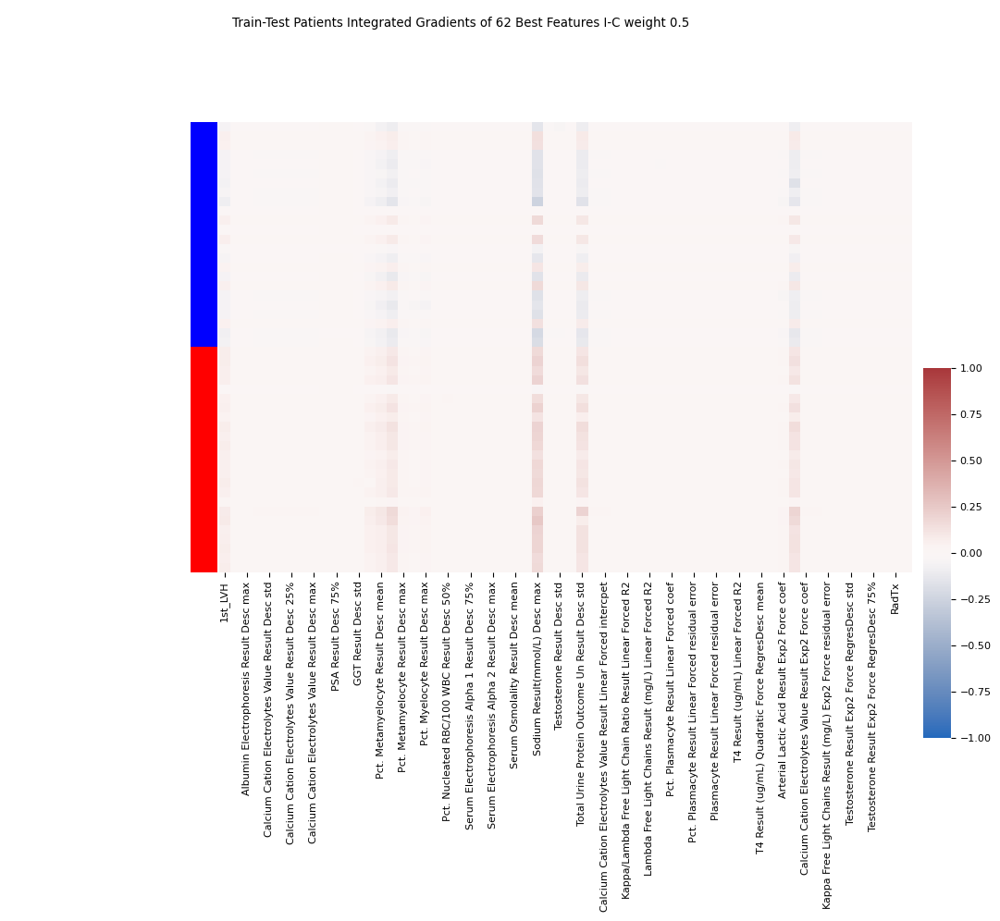

In [76]:
# Xtop3 = pd.DataFrame(CV_sets[fold]["test"]["X"][:,featRank_D["sorted"][0:topFeaturesNumber ].astype(int)], 
#                      index=CV_sets[fold]["test"]["y"],
#                      columns=X.columns[modelD_FeaturesInt])
# IG = compute_SV_integrated_gradient(tesTune05["best_models"][fold],
#                                    CV_sets[fold]["test"]["X"][:,modelD_FeaturesInt])

IGtable_wIndex = pd.DataFrame(IG, index=CV_sets_trainANDtest_y, columns=X.columns[modelD_FeaturesInt])

IGtable_wIndex.reset_index(drop=True, inplace=True)
fig = clustermap(IGtable_wIndex.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-1, vmax=1,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])

plt.suptitle("Train-Test Patients Integrated Gradients of "+ str(modelD_numbFeatures) +' Best Features I-C weight 0.5')
plt.show()

figCommon = fileName_common + "fig7_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

In [77]:
# CV_sets_trainANDtest_X = np.concatenate((CV_sets[fold]["train"]["X"][:,modelD_FeaturesInt],CV_sets[fold]["test"]["X"][:,modelD_FeaturesInt]), axis =0)
# CV_sets_trainANDtest_y = np.concatenate((CV_sets[fold]["train"]["y"],CV_sets[fold]["test"]["y"]), axis = 0)

In [78]:
# fig = shap.summary_plot(IG,  CV_sets_trainANDtest_X, max_display=modelD_numbFeatures , 
#                   feature_names=X.columns[modelD_FeaturesInt],cmap="seismic", show = False)
# plt.suptitle("Train-Test Patients Integrated Gradient Parameters Training with top "+ str(modelD_numbFeatures) +' features')
# # plt.show()

# figCommon = fileName_common + "fig8"
# figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# plt.savefig(figPath, bbox_inches = 'tight')  # same as figure 5?

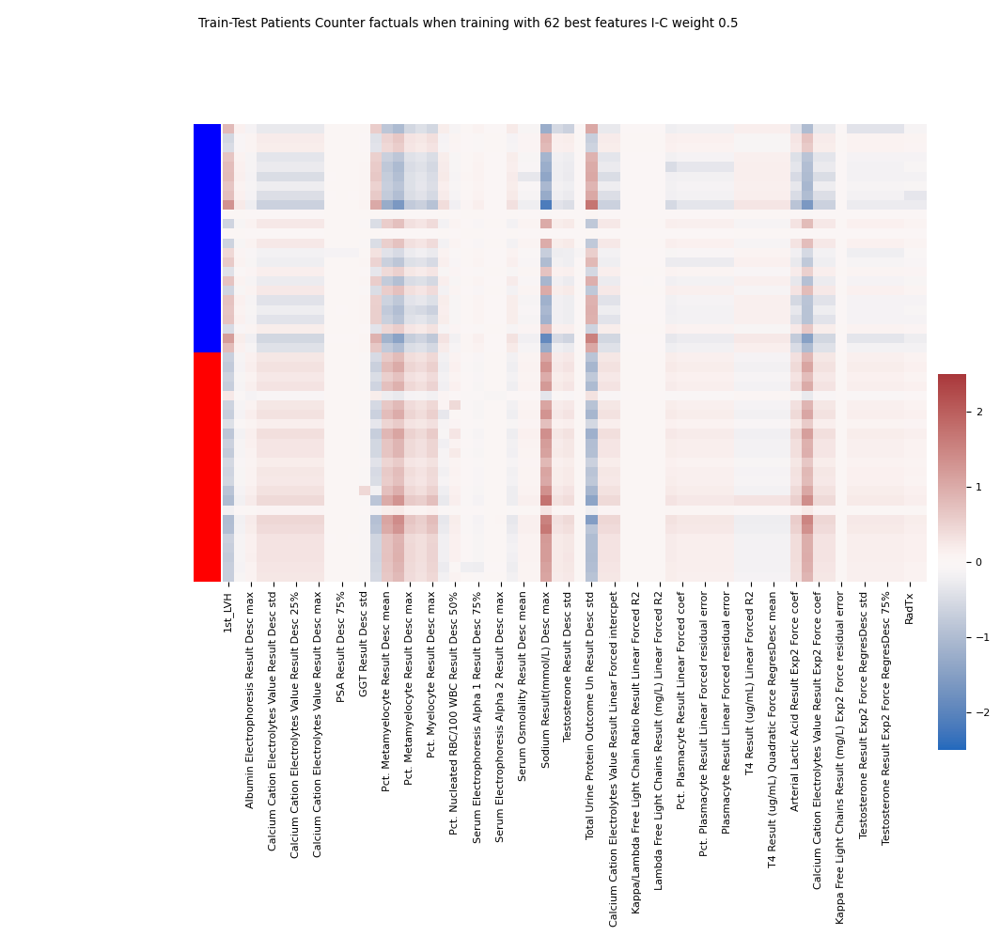

In [79]:
counterfactuals = compute_counterfactuals(tesTune05["best_models"][fold], 
                                          CV_sets_trainANDtest_X)
CFtable = pd.DataFrame(counterfactuals, 
                       index=CV_sets_trainANDtest_y,columns=X.columns[modelD_FeaturesInt])

CFtable.reset_index(drop=True, inplace=True)
fig = clustermap(CFtable.iloc[np.argsort(CV_sets_trainANDtest_y),:],#/abs(Xtop3.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:]), 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-2.5, vmax=2.5,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Train-Test Patients Counter factuals when training with "+ str(modelD_numbFeatures) +' best features I-C weight 0.5')
# plt.show()

figCommon = fileName_common + "fig9_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

In [80]:
# #pickling the tesTune object
# pickle_file = open('tesTune2_object_file', 'wb')
# pickle.dump(tesTune2, pickle_file)

In [81]:
pickle_file_name = 'tesTune05_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(tesTune05, pickle_file)

## hyper parameter tuning for best features 0.75 weighting

In [82]:
modelE_Features = featRank_E["best_features"] #to get the best features which take highest score and highest C
modelE_FeaturesInt = featRank_E["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelE_numbFeatures = len(modelE_FeaturesInt) #number of features

#list of column names
modelE_FeaturesIntList = X.columns[featRank_E["best_features"].astype(int)]

In [83]:
#setting the parameters for the plots below
featuresInt = modelE_FeaturesInt
numbFeatures = modelE_numbFeatures
ListFeatureColNames = modelE_FeaturesIntList

In [84]:
#creation of classifier using the features found in ranking above
#creation of tesTune_075
tesTune075 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range,feature_index=featuresInt)
print(tesTune075["best_params"])

   c         g   f1  auc  score
0  4  0.007812  1.0  1.0    1.0


In [85]:
#pickling tesTune075
pickle_file_name = 'tesTune075_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(tesTune075, pickle_file)

In [86]:
#setting the tuned SVM model for the plots below
tunedModel = tesTune075

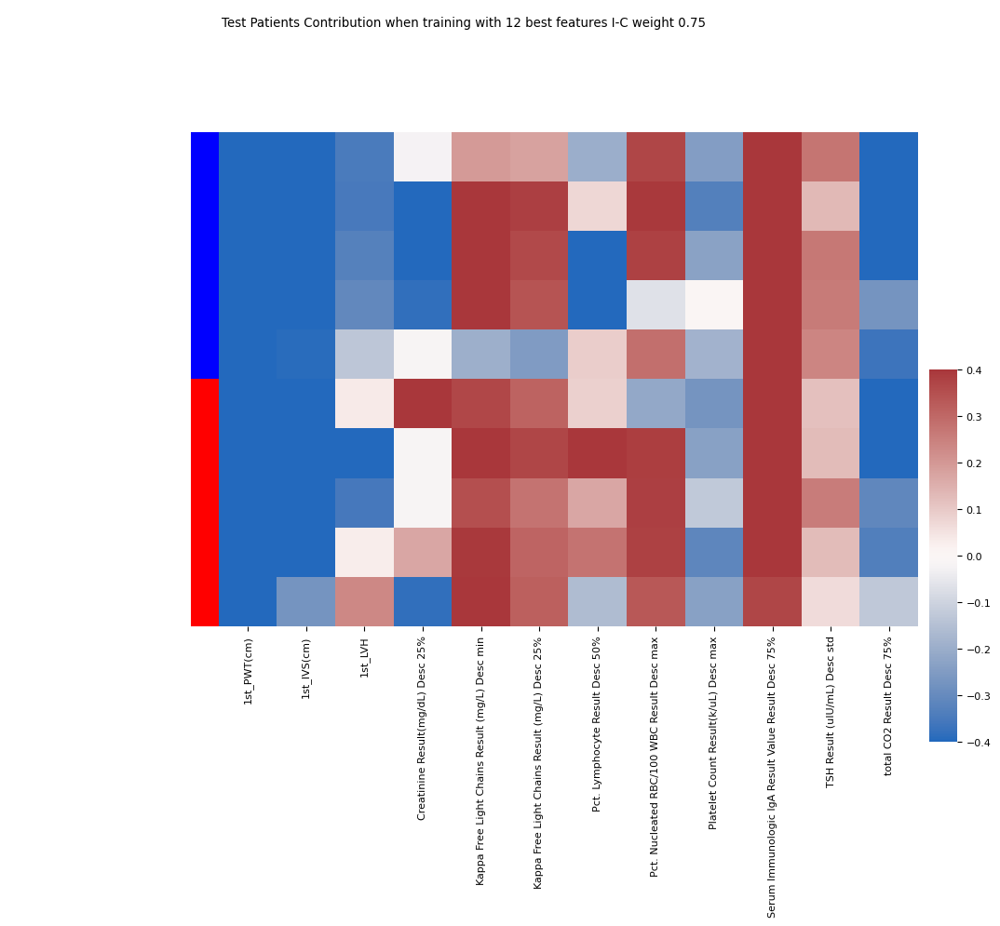

In [87]:
#feature contribution plot using only the test data
feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets[fold]["test"]["X"][:,featuresInt])
FItable = pd.DataFrame(feat_contribution, index=CV_sets[fold]["test"]["y"],columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:], 
           yticklabels=False,
           cmap="vlag", vmin=-0.4, vmax=0.4,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets[0]["test"]["y"].values[np.argsort(CV_sets[fold]["test"]["y"].values)]])
plt.suptitle("Test Patients Contribution when training with "+  str(numbFeatures)+ " best features I-C weight 0.75")

figCommon = fileName_common + "fig3_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

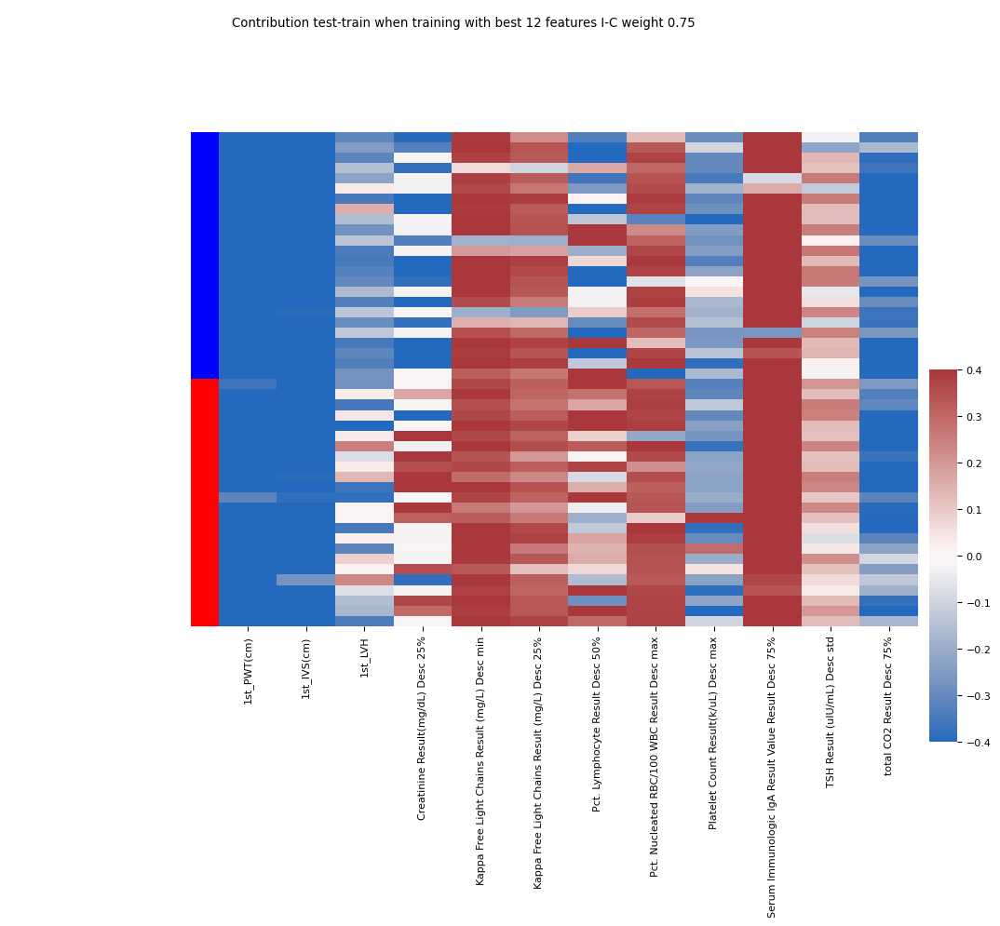

In [88]:
#feature contribution cluster map for all test and train patients
CV_sets_trainANDtest_X = np.concatenate((CV_sets[fold]["train"]["X"][:,featuresInt],CV_sets[fold]["test"]["X"][:,featuresInt]), axis =0)
CV_sets_trainANDtest_y = np.concatenate((CV_sets[fold]["train"]["y"],CV_sets[fold]["test"]["y"]), axis = 0)

feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets_trainANDtest_X)
FItable = pd.DataFrame(feat_contribution, index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           cmap="vlag", vmin=-0.4, vmax=0.4,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Contribution test-train when training with best "+  str(numbFeatures)+ " features I-C weight 0.75")

figCommon = fileName_common + "fig3_2_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

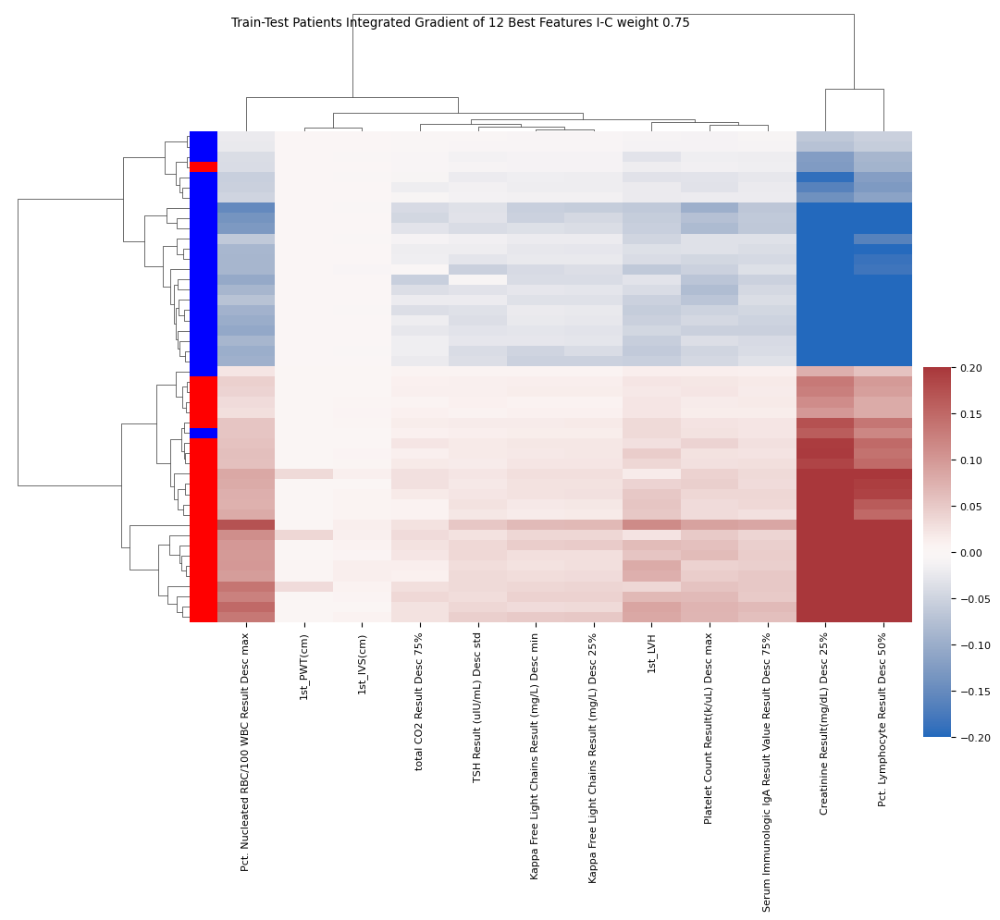

In [89]:
#integrated gradient cluster map with heigharchical clustering

IG = compute_SV_integrated_gradient(tunedModel["best_models"][fold], CV_sets_trainANDtest_X)

IGtable = pd.DataFrame(IG,columns=ListFeatureColNames)

fig = clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-0.2, vmax=0.2,
           #row_linkage=hcRow, col_linkage=hcCol, 
           cbar_pos=(1, .2, .03, .4),
        #    row_colors=[["red","blue"][int(l=="B")+0] for l in CV_sets[0]["test"]["y"].values]
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y])
plt.suptitle("Train-Test Patients Integrated Gradient of "+  str(numbFeatures)+ " Best Features I-C weight 0.75")
plt.show()

figCommon = fileName_common + "fig4_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

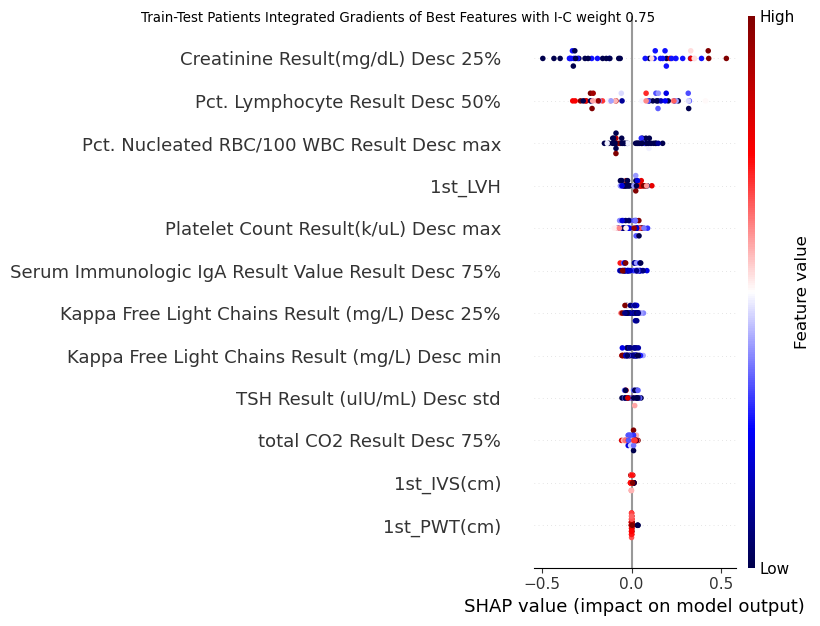

In [90]:
#shap plot for integrated gradients
fig = shap.summary_plot(IG,  CV_sets_trainANDtest_X, max_display=numbFeatures , 
                  feature_names=ListFeatureColNames,cmap="seismic", show = False)
plt.suptitle("Train-Test Patients Integrated Gradients of Best Features with I-C weight 0.75")
figCommon = fileName_common + "fig5_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

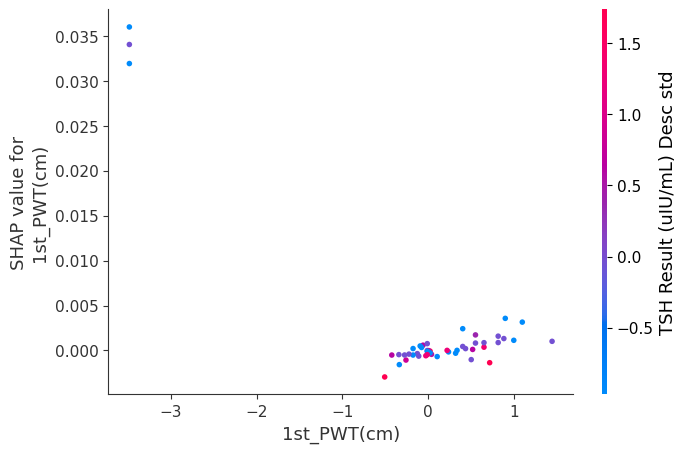

In [91]:
#shap dependence plot
Xcv = pd.DataFrame(CV_sets_trainANDtest_X, 
                     index=CV_sets_trainANDtest_y,
                     columns=ListFeatureColNames)

fig6_feature_to_plot= ListFeatureColNames[0]

shap.dependence_plot( fig6_feature_to_plot , IG, Xcv, show = False)

figCommon = fileName_common + "fig6_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

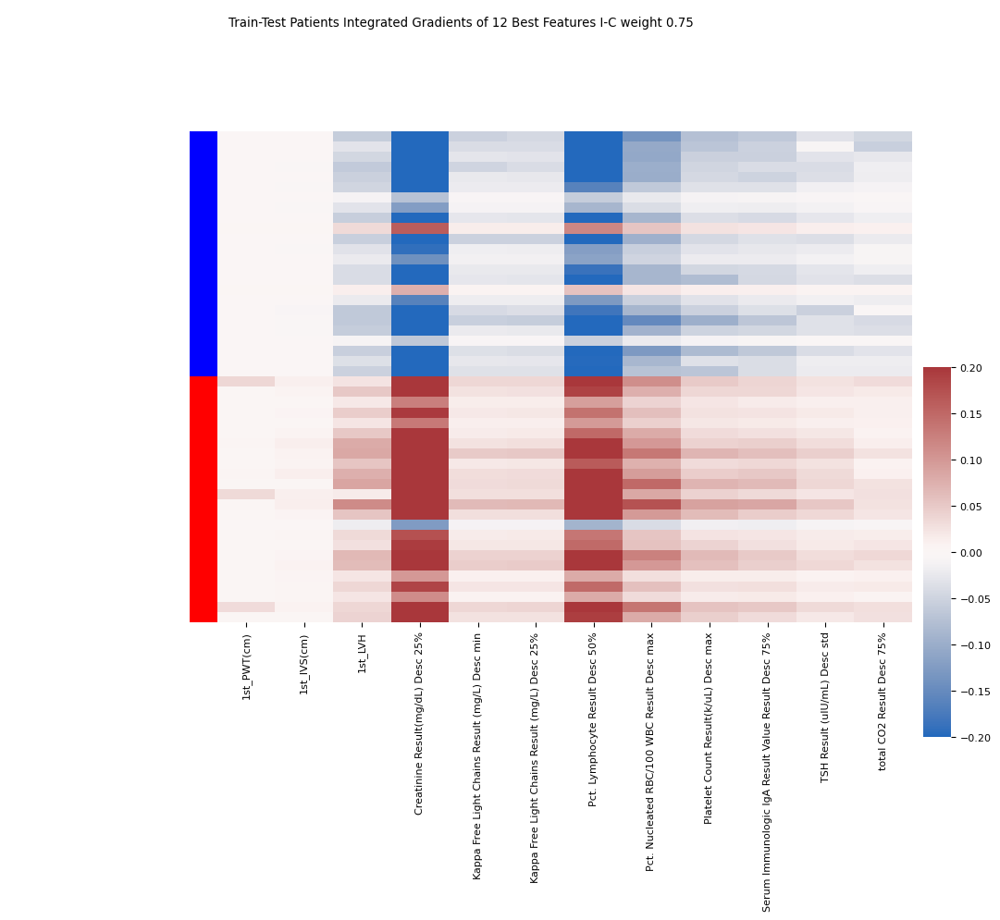

In [92]:
#cluster map of integrated gradients sorted by index
IGtable_wIndex = pd.DataFrame(IG, index=CV_sets_trainANDtest_y, columns=ListFeatureColNames)

IGtable_wIndex.reset_index(drop=True, inplace=True)
fig = clustermap(IGtable_wIndex.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-0.2, vmax=0.2,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])

plt.suptitle("Train-Test Patients Integrated Gradients of "+ str(numbFeatures) +' Best Features I-C weight 0.75')
plt.show()

figCommon = fileName_common + "fig7_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

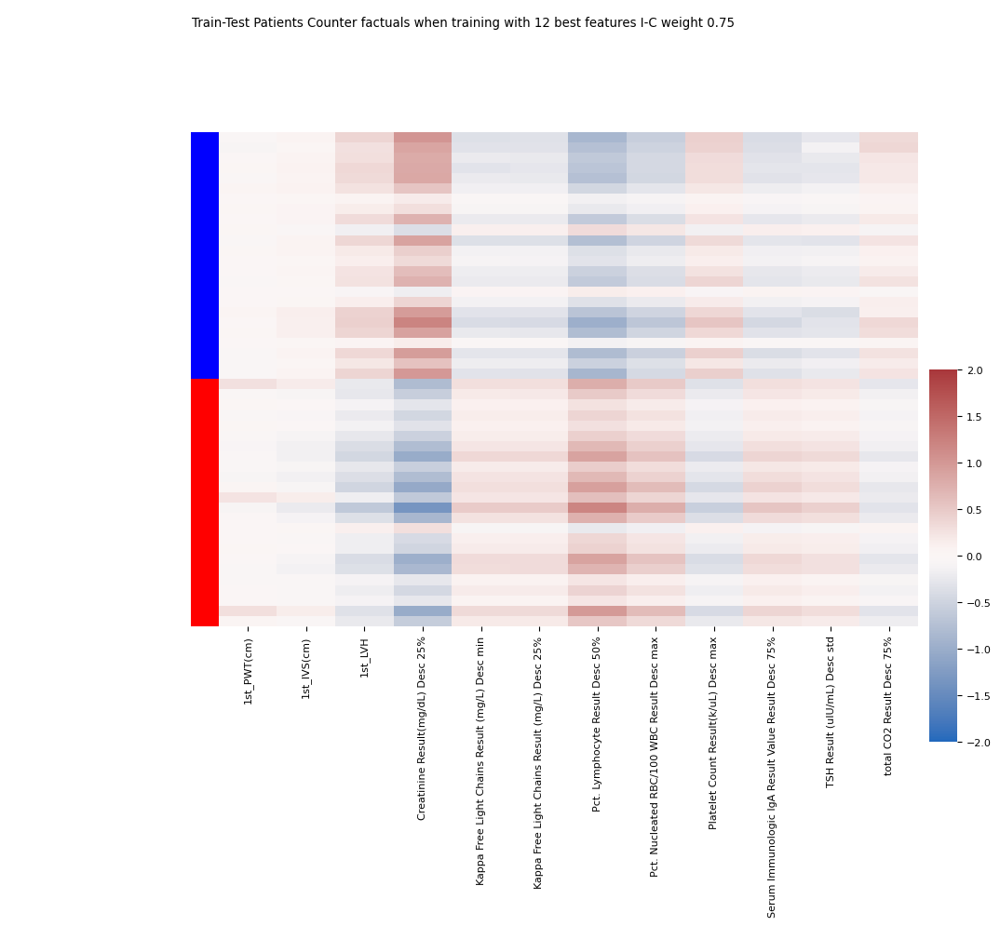

In [93]:
#counter factuals map
counterfactuals = compute_counterfactuals(tunedModel["best_models"][fold], 
                                          CV_sets_trainANDtest_X)
CFtable = pd.DataFrame(counterfactuals, 
                       index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

CFtable.reset_index(drop=True, inplace=True)
fig = clustermap(CFtable.iloc[np.argsort(CV_sets_trainANDtest_y),:],#/abs(Xtop3.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:]), 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-2, vmax=2,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Train-Test Patients Counter factuals when training with "+ str(numbFeatures) +' best features I-C weight 0.75')
# plt.show()

figCommon = fileName_common + "fig9_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

## hyperparameter tuning using list of best features from feature selection with only contribution featRank_B

In [94]:
modelB_Features = featRank_B["best_features"] #to get the best features which take highest score and highest C
modelB_FeaturesInt = featRank_B["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelB_numbFeatures = len(modelB_FeaturesInt) #number of features

#list of column names
modelB_FeaturesIntList = X.columns[featRank_B["best_features"].astype(int)]

In [95]:
#setting the parameters for the plots below
featuresInt = modelB_FeaturesInt
numbFeatures = modelB_numbFeatures
ListFeatureColNames = modelB_FeaturesIntList

In [96]:
#creation of classifier using the features found in ranking above
#creation of tesTune_1
tesTune100 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range,feature_index=featuresInt)
print(tesTune100["best_params"])

     c        g        f1  auc     score
0  0.5  0.03125  0.955556  1.0  0.977778


In [97]:
#pickling tesTune100
pickle_file_name = 'tesTune100_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(tesTune100, pickle_file)

In [98]:
#setting the tuned SVM model for the plots below
tunedModel = tesTune100

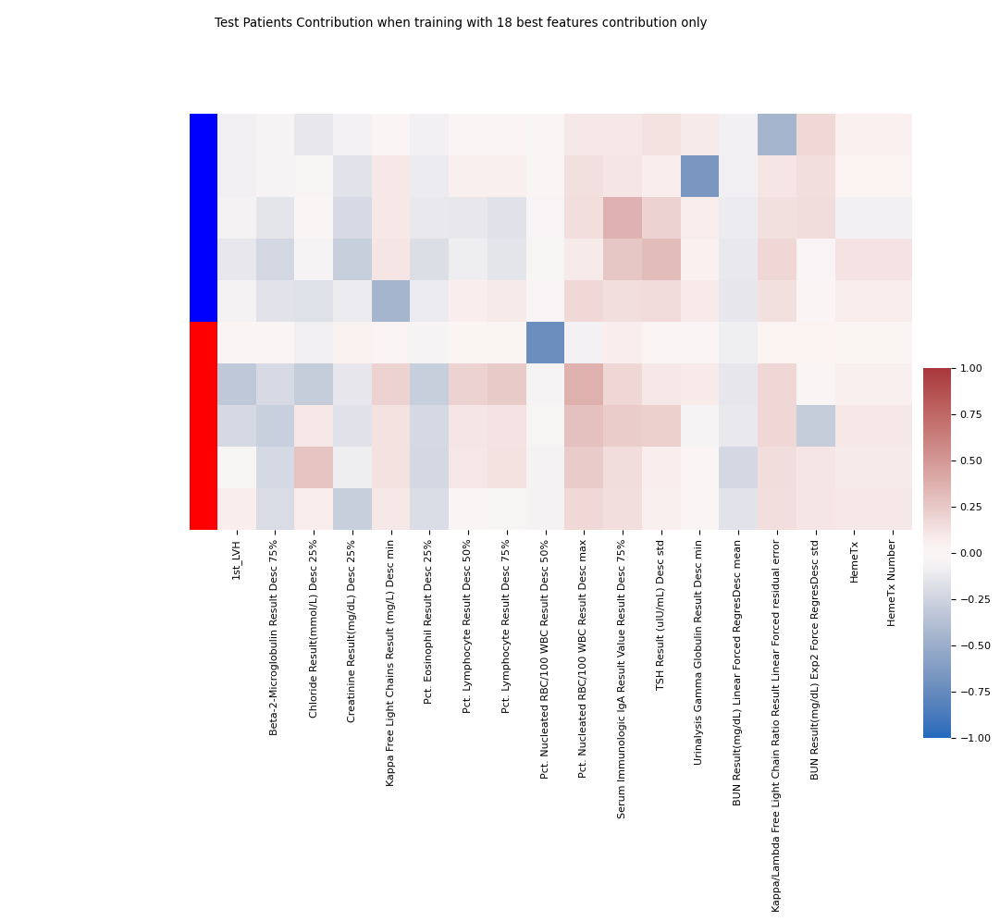

In [99]:
#feature contribution plot using only the test data
feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets[fold]["test"]["X"][:,featuresInt])
FItable = pd.DataFrame(feat_contribution, index=CV_sets[fold]["test"]["y"],columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:], 
           yticklabels=False,
           cmap="vlag", vmin=-1, vmax=1,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets[0]["test"]["y"].values[np.argsort(CV_sets[fold]["test"]["y"].values)]])
plt.suptitle("Test Patients Contribution when training with "+  str(numbFeatures)+ " best features contribution only")

figCommon = fileName_common + "fig3_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

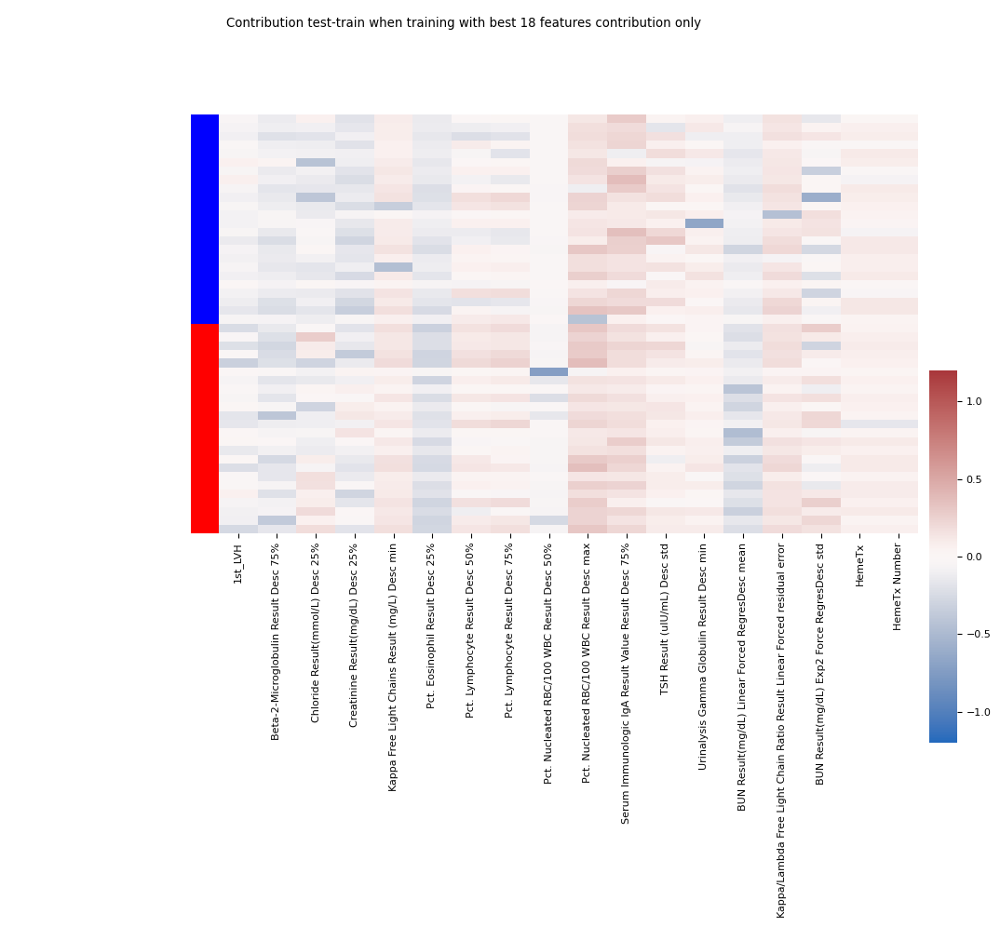

In [100]:
#feature contribution cluster map for all test and train patients
CV_sets_trainANDtest_X = np.concatenate((CV_sets[fold]["train"]["X"][:,featuresInt],CV_sets[fold]["test"]["X"][:,featuresInt]), axis =0)
CV_sets_trainANDtest_y = np.concatenate((CV_sets[fold]["train"]["y"],CV_sets[fold]["test"]["y"]), axis = 0)

feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets_trainANDtest_X)
FItable = pd.DataFrame(feat_contribution, index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           cmap="vlag", vmin=-1.2, vmax=1.2,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Contribution test-train when training with best "+  str(numbFeatures)+ " features contribution only")

figCommon = fileName_common + "fig3_2_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

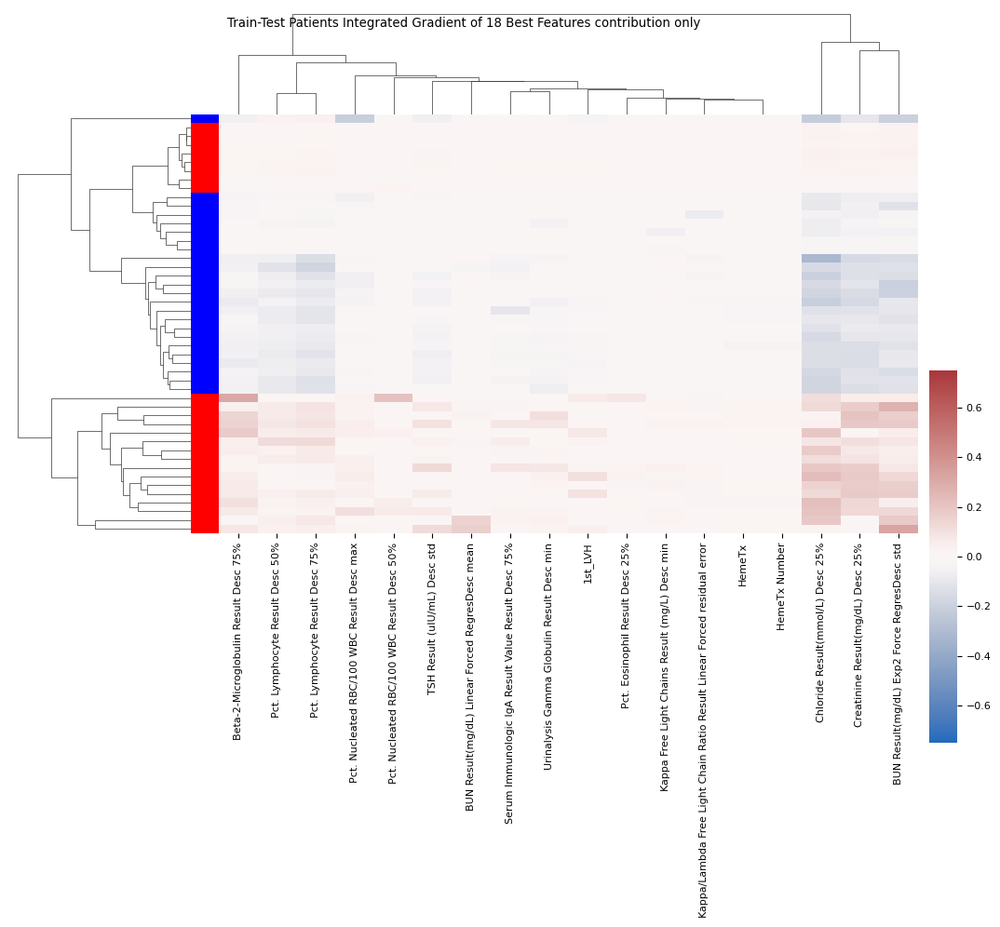

In [101]:
#integrated gradient cluster map with heigharchical clustering

IG = compute_SV_integrated_gradient(tunedModel["best_models"][fold], CV_sets_trainANDtest_X)

IGtable = pd.DataFrame(IG,columns=ListFeatureColNames)

fig = clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-0.75, vmax=0.75,
           #row_linkage=hcRow, col_linkage=hcCol, 
           cbar_pos=(1, .2, .03, .4),
        #    row_colors=[["red","blue"][int(l=="B")+0] for l in CV_sets[0]["test"]["y"].values]
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y])
plt.suptitle("Train-Test Patients Integrated Gradient of "+  str(numbFeatures)+ " Best Features contribution only")
plt.show()

figCommon = fileName_common + "fig4_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

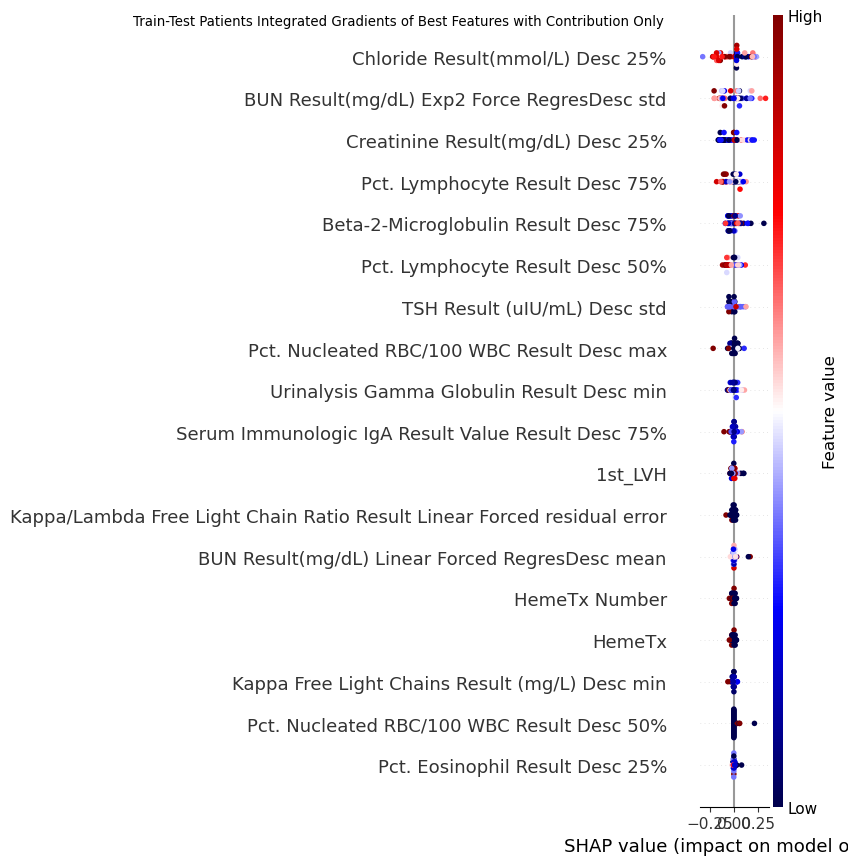

In [102]:
#shap plot for integrated gradients
fig = shap.summary_plot(IG,  CV_sets_trainANDtest_X, max_display=numbFeatures , 
                  feature_names=ListFeatureColNames,cmap="seismic", show = False)
plt.suptitle("Train-Test Patients Integrated Gradients of Best Features with Contribution Only")
figCommon = fileName_common + "fig5_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

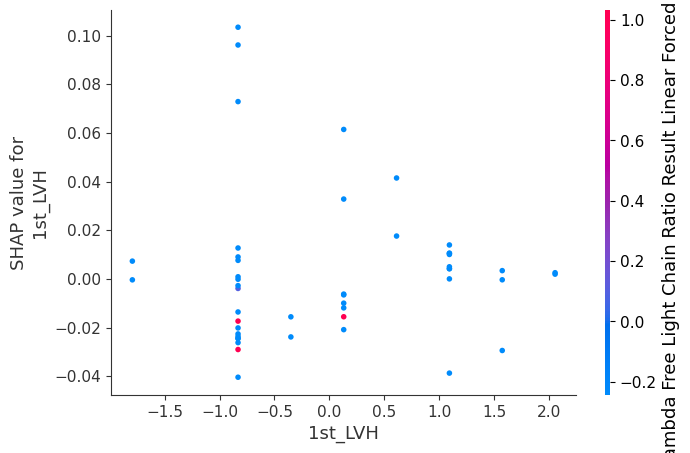

In [103]:
#shap dependence plot
Xcv = pd.DataFrame(CV_sets_trainANDtest_X, 
                     index=CV_sets_trainANDtest_y,
                     columns=ListFeatureColNames)

fig6_feature_to_plot= ListFeatureColNames[0]

shap.dependence_plot( fig6_feature_to_plot , IG, Xcv, show = False)

figCommon = fileName_common + "fig6_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

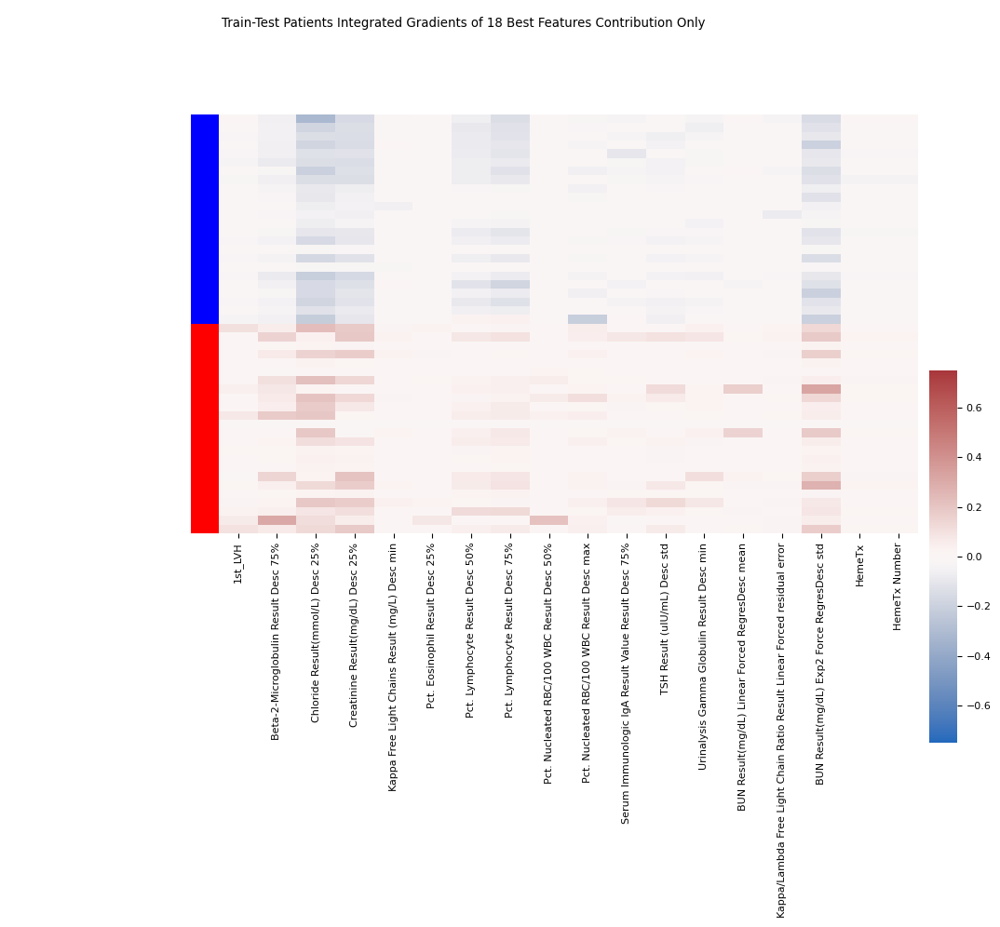

In [104]:
#cluster map of integrated gradients sorted by index
IGtable_wIndex = pd.DataFrame(IG, index=CV_sets_trainANDtest_y, columns=ListFeatureColNames)

IGtable_wIndex.reset_index(drop=True, inplace=True)
fig = clustermap(IGtable_wIndex.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-0.75, vmax=0.75,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])

plt.suptitle("Train-Test Patients Integrated Gradients of "+ str(numbFeatures) +' Best Features Contribution Only')
plt.show()

figCommon = fileName_common + "fig7_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

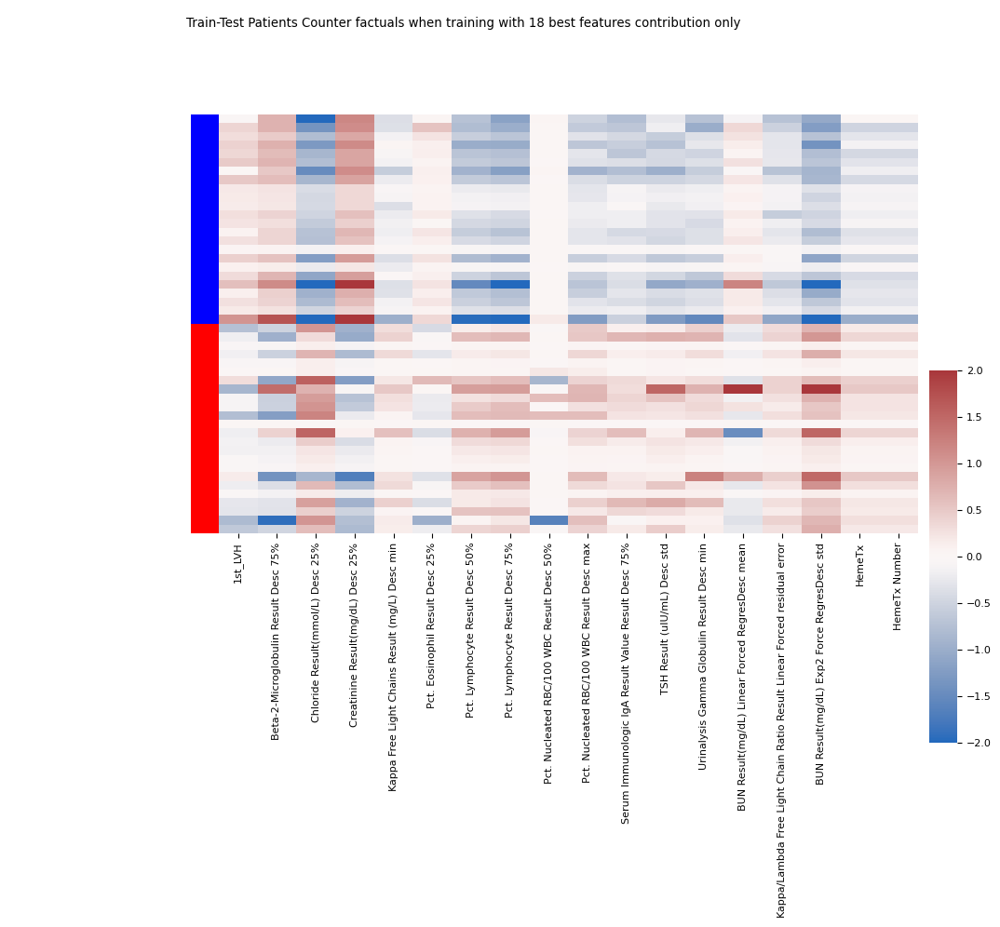

In [105]:
#counter factuals map
counterfactuals = compute_counterfactuals(tunedModel["best_models"][fold], 
                                          CV_sets_trainANDtest_X)
CFtable = pd.DataFrame(counterfactuals, 
                       index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

CFtable.reset_index(drop=True, inplace=True)
fig = clustermap(CFtable.iloc[np.argsort(CV_sets_trainANDtest_y),:],#/abs(Xtop3.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:]), 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-2, vmax=2,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Train-Test Patients Counter factuals when training with "+ str(numbFeatures) +' best features contribution only')
# plt.show()

figCommon = fileName_common + "fig9_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

# Feature reduction iteration

## Using the best features from feature reduction step 1 to perform feature reduction step 2


In [106]:
#new directory information for sequential feature reduction

#for file outputs
fileName_header = "AllLabs_240716_fitRed033-01" #what data did you put in
fileName_common = "_Mistic_" #what was performed on the data, for figures, this may be added to
fileName_suffix = "_2024-07-25_v1" #date and versioning

# saving_dirrectory = "C:/Users/maega/Documents/3000 PhD/3300_BEAT Labs/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/"
saving_dirrectory = "012 Processed Data"
makingFolder = makeFolderPathForData(parent_dir= saving_dirrectory, folderName_header= "SVM_Mistic_AllLabs_033-01FitRed", folderName_common= "2024-07-25_", 
                                     folderName_suffix= "v1")
dataFrameFolderOut =  makingFolder #"SVM_Mistic_Output_2024-07-19_v2"
pickleFolderOut = makingFolder

figDirectory = "012 Processed Data"
figFolder = makingFolder #"SVM_Mistic_Output_2024-07-19_v2"

In [107]:
#collect the best features from each of the best models with different weighting
#or collect the top 1/3 of features from the list... start with the sorted features, since 0 is the last removed feature.  take the top 1/3

#find number of features
numb_overall_features = int(len(featRank_D["sorted"]))
features_third = int(numb_overall_features/3) #forces the number to an integer to avoid floats
modelD_topThirdFeatures = featRank_D["sorted"][:features_third].astype(int)

#collect from each model 
modelE_topThirdFeatures = featRank_E["sorted"][:features_third].astype(int)
modelB_topThirdFeatures = featRank_B["sorted"][:features_third].astype(int)

#combine all and find the unique features
allTopThird = np.concatenate((modelD_topThirdFeatures, modelE_topThirdFeatures, modelB_topThirdFeatures), axis = None)
uniqueTopThirdFeatures = pd.unique(allTopThird)

#get the dataframe to these features
X_train_all_new = X_train_all[:, uniqueTopThirdFeatures]

#reassign value to simplify code below 
X_train_all = X_train_all_new

In [108]:
#no need to individually save the list of features as they will be available as the total list of features in the new excel file

### test-train split with the new reduced number of features

In [109]:
# Number of training sets
NT = 5 

# Data split ratio
val_size = 1/NT

#Feature selection reduction factor
red_factor = 0.1

In [110]:
# split train set into train and test(val) data / repeat NT times and |get NT number of datsets
CV_sets = []
for i in range(NT):
    X_train, X_test, y_train, y_test = train_test_split(X_train_all, y_train_all, 
                                                        stratify = y_train_all, 
                                                        random_state= i, 
                                                        test_size= val_size)
    
    CV_set = {"train": {"X": X_train,"y": y_train}, "test":  {"X": X_test, "y": y_test}} 
    CV_sets.append(CV_set)

In [111]:
#pickling the CV sets object
pickle_file_name = 'CV_sets_object_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(CV_sets, pickle_file)

In [112]:
C_range = [2**x for x in range(-2,5)] # trade-off between margin and misclassifications.  smaller c, wider margins
gamma_range = [2**x for x in range(-9,1)]

svc = SVC(kernel = 'rbf', class_weight="balanced", probability=False)

### creation of model 
Uses the unique features from the top 1/3 of featurse in models D, E, B.\

In [113]:
tesTune03301 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range)
tesTune["best_params"]

,c,g,f1,auc,score
0,0.25,1,0.666667,0.5,0.583333


In [114]:
#saving the first test tune set
perf = tesTune03301["performance"]
tesTune_best_params = tesTune03301["best_params"]

outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "tesTune perf")
outputToExcel(df_data=tesTune_best_params, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "tesTune best params")

In [115]:
#pickling the tesTune object
pickle_file_name = 'tesTune03301_object_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(tesTune, pickle_file)

In [116]:
# #to upload a pickled set use this block
# pickle_file_name = 'tesTune03301_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# tesTune03301 = pickle.load(pickle_file)

## feature selection and hyper parameter tuning

In [117]:
featRank_A = greedy_backward_selection(svc, X_train_all, CV_sets, compute_SV_importance_rank, svc_score().score, C_range, gamma_range, redF = red_factor)


      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2861      19.0
   c         g        f1   auc     score  nFeats  mean_nSV
0  1  0.001953  0.547778  0.56  0.553889    2574      19.0
   c         g       f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.81101  0.792  0.801505    2316      19.0
      c         g       f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.81101  0.816  0.813505    2084      19.0
      c         g       f1   auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.81101  0.84  0.825505    1875      19.0
      c         g       f1   auc     score  nFeats  mean_nSV
0  0.25  0.003906  0.81101  0.84  0.825505    1687      19.0
      c         g    f1    auc  score  nFeats  mean_nSV
0  0.25  0.001953  0.86  0.864  0.862    1518      19.0
      c     g    f1    auc  score  nFeats  mean_nSV
0  0.25  0.25  0.86  0.876  0.868    1366      19.0
   c       g        f1    auc     score  nFeats  mean_

In [118]:
#if not already pickled use this block
pickle_file_name = 'featRankA_object_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_A, pickle_file)


In [119]:
pickle_file_name = 'featRankA_object_' + fileName_header + fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_A, pickle_file)

In [120]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_A["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_A["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_A["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A best features")

df_bestModels= pd.DataFrame(featRank_A["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_A["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_A feature rank")


featRank_A upload from pickle

In [121]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankA_object_' + fileName_header +fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_A = pickle.load(pickle_file)


compile featRank_B 

In [122]:
featRank_B = greedy_backward_selection(svc, X_train_all, CV_sets, compute_SV_contribution_rank, svc_score().score, C_range, gamma_range, redF = red_factor)

      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2861      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2574      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2316      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2084      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.504  0.541408    1875      19.0
      c         g        f1   auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.569927  0.52  0.544963    1687      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.562654  0.552  0.557327    1518      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578974  0.552  0.565487    1366     

In [123]:
pickle_file_name = 'featRankB_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_B, pickle_file)

In [124]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_B["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_B["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_B["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B best features")

df_bestModels= pd.DataFrame(featRank_B["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_B["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_B feature rank")


load featRank_B from pickle


In [125]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankB_object_' + fileName_header +fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_B = pickle.load(pickle_file)


compile featRank_C

In [126]:
featRank_C = greedy_backward_selection(svc, X_train_all, CV_sets, SV_combined_rank(weight=0.25).compute, svc_score().score, C_range, gamma_range, redF = red_factor)

      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2861      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.547778  0.552  0.549889    2574      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.747518  0.792  0.769759    2316      19.0
      c         g       f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.81101  0.872  0.841505    2084      19.0
      c         g       f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.81101  0.832  0.821505    1875      19.0
      c         g       f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.81101  0.816  0.813505    1687      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.837273  0.816  0.826636    1518      19.0
    c         g        f1    auc     score  nFeats  mean_nSV
0  16  0.003906  0.812331  0.808  0.810166    1366      19.0
   c    g        f1 

In [127]:
pickle_file_name = 'featRankC_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_C, pickle_file)


In [128]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_C["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_C["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_C["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C best features")

df_bestModels= pd.DataFrame(featRank_C["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_C["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_C feature rank")


upload featRank_C from pickle

In [129]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankC_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_C = pickle.load(pickle_file)


compile featRank_D


In [130]:
featRank_D = greedy_backward_selection(svc, X_train_all, CV_sets, SV_combined_rank(weight=0.5).compute, svc_score().score, C_range, gamma_range, redF = red_factor)

      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2861      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.569927  0.496  0.532963    2574      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.602222  0.576  0.589111    2316      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.642222  0.616  0.629111    2084      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.681154  0.696  0.688577    1875      19.0
   c         g        f1    auc     score  nFeats  mean_nSV
0  1  0.001953  0.712063  0.752  0.732032    1687      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.769336  0.816  0.792668    1518      19.0
      c         g        f1   auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.783232  0.84  0.811616    1366      19.0
      c     

In [131]:
pickle_file_name = 'featRankD_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_D, pickle_file)

In [132]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_D["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_D["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_D["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D best features")

df_bestModels= pd.DataFrame(featRank_D["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_D["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_D feature rank")


In [133]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankD_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_D = pickle.load(pickle_file)


comiple featRank_E


In [134]:
featRank_E = greedy_backward_selection(svc, X_train_all, CV_sets, SV_combined_rank(weight=0.75).compute, svc_score().score, C_range, gamma_range, redF = red_factor)


      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2861      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2574      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2316      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.496  0.537408    2084      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.578816  0.504  0.541408    1875      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.569927  0.544  0.556963    1687      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.589927  0.552  0.570963    1518      19.0
      c         g        f1    auc     score  nFeats  mean_nSV
0  0.25  0.001953  0.576593  0.584  0.580297    1366   

In [135]:
pickle_file_name = 'featRankE_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(featRank_E, pickle_file)


In [136]:
#saving the feature ranking, performance, and model evaluations to spreadsheets
perf = featRank_E["performance"]
# perf
outputToExcel(df_data=perf, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E performance")

df_columnNames_ranked = pd.DataFrame(list(X.columns[featRank_E["sorted"].astype(int)]))
#saving the column ranking
outputToExcel(df_data=df_columnNames_ranked, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E col ranked")

df_bestFeatures= pd.DataFrame(list(X.columns[featRank_E["best_features"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E best features")

df_bestModels= pd.DataFrame(featRank_E["best_models"])
#saving the best features
outputToExcel(df_data=df_bestModels, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E best models")

df_Rank= pd.DataFrame(list(X.columns[featRank_E["rank"].astype(int)]))
#saving the best features
outputToExcel(df_data=df_Rank, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "featRank_E feature rank")


In [137]:
# #to upload a pickled set use this block
# pickle_file_name = 'featRankE_object_' + fileName_header + fileName_suffix
# pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
# pickle_file = open(pickle_filePath, 'rb')

# #to put data into an object
# featRank_E = pickle.load(pickle_file)

## performance plots general 

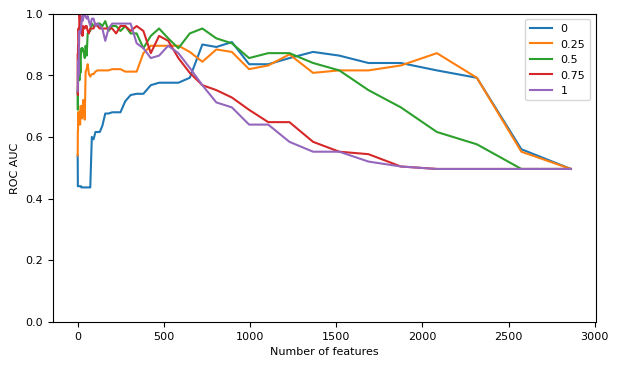

In [138]:
fig, ax = plt.subplots(1,1, figsize=(7, 4))
plt.plot(featRank_A["performance"].nFeats, featRank_A["performance"].auc) 
plt.plot(featRank_C["performance"].nFeats, featRank_C["performance"].auc) 
plt.plot(featRank_D["performance"].nFeats, featRank_D["performance"].auc) 
plt.plot(featRank_E["performance"].nFeats, featRank_E["performance"].auc)
plt.plot(featRank_B["performance"].nFeats, featRank_B["performance"].auc) 

plt.ylim(0,1)

plt.legend(['0','0.25','0.5','0.75','1'])
plt.ylabel('ROC AUC')
plt.xlabel('Number of features')
plt.show()

#saving figure
figCommon = fileName_common + "fig1"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# plt.tight_layout()
fig.savefig(figPath, bbox_inches = 'tight')

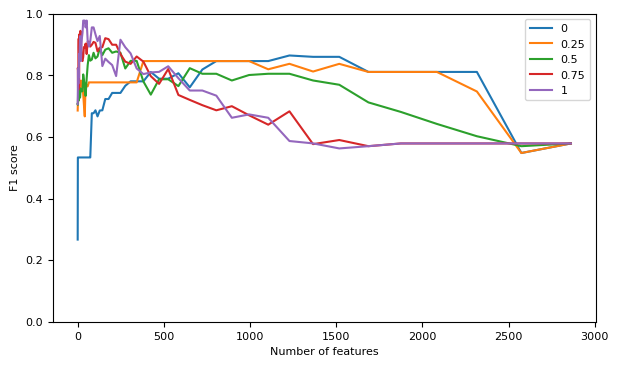

In [139]:
fig, ax = plt.subplots(1,1, figsize=(7, 4))
plt.plot(featRank_A["performance"].nFeats, featRank_A["performance"].f1) 
plt.plot(featRank_C["performance"].nFeats, featRank_C["performance"].f1) 
plt.plot(featRank_D["performance"].nFeats, featRank_D["performance"].f1) 
plt.plot(featRank_E["performance"].nFeats, featRank_E["performance"].f1) 
plt.plot(featRank_B["performance"].nFeats, featRank_B["performance"].f1) 

plt.ylim(0,1)

plt.legend(['0','0.25','0.5','0.75','1'])
plt.ylabel('F1 score')
plt.xlabel('Number of features')
plt.show()

#saving figure
figCommon = fileName_common + "fig2"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

### model specific early feature evaluation

In [140]:
X.columns[featRank_D["sorted"].astype(int)]

Index(['Plasmacyte Result Linear Forced RegresDesc min',
       '25 Hydroxy Vitamin D Result Desc 75%', '5-HIAA Result Desc count',
       '1st_outerLS', 'Macrocytes Result Desc std',
       'Plasmacyte Result Linear Forced RegresDesc max',
       'Eosinophil Result Desc max', '1st_LA_grade',
       'Lipase Result Linear Forced RegresDesc min', '1st_LA_dimension (cm)',
       ...
       'Digoxin Result Desc std', 'Digoxin Result Desc mean',
       'Digoxin Result Desc count',
       'Creatinine, Point of care Result Desc max',
       'Creatinine, Point of care Result Desc 75%',
       'Creatinine, Point of care Result Desc 50%',
       'Creatinine, Point of care Result Desc 25%',
       'Creatinine, Point of care Result Desc min',
       'Creatinine, Point of care Result Desc std',
       'Creatinine, Point of care Result Desc mean'],
      dtype='object', length=2861)

In [141]:
listX = list(X.columns[featRank_D["sorted"].astype(int)])

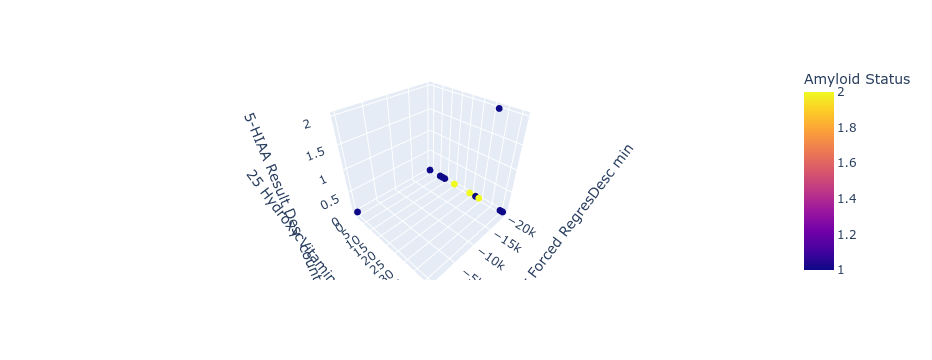

In [142]:
fig = px.scatter_3d(dataTable, x=listX[0], y=listX[1], z=listX[2],
              color= y_column_Classification)
fig.update_traces(marker_size = 4)
fig.show()

In [143]:
#setting number of features for performance test
fold = 0
number_feat_perf_test = 25 #describes for testing performance 
numb_features_figures = 5 #number of features to use in plots

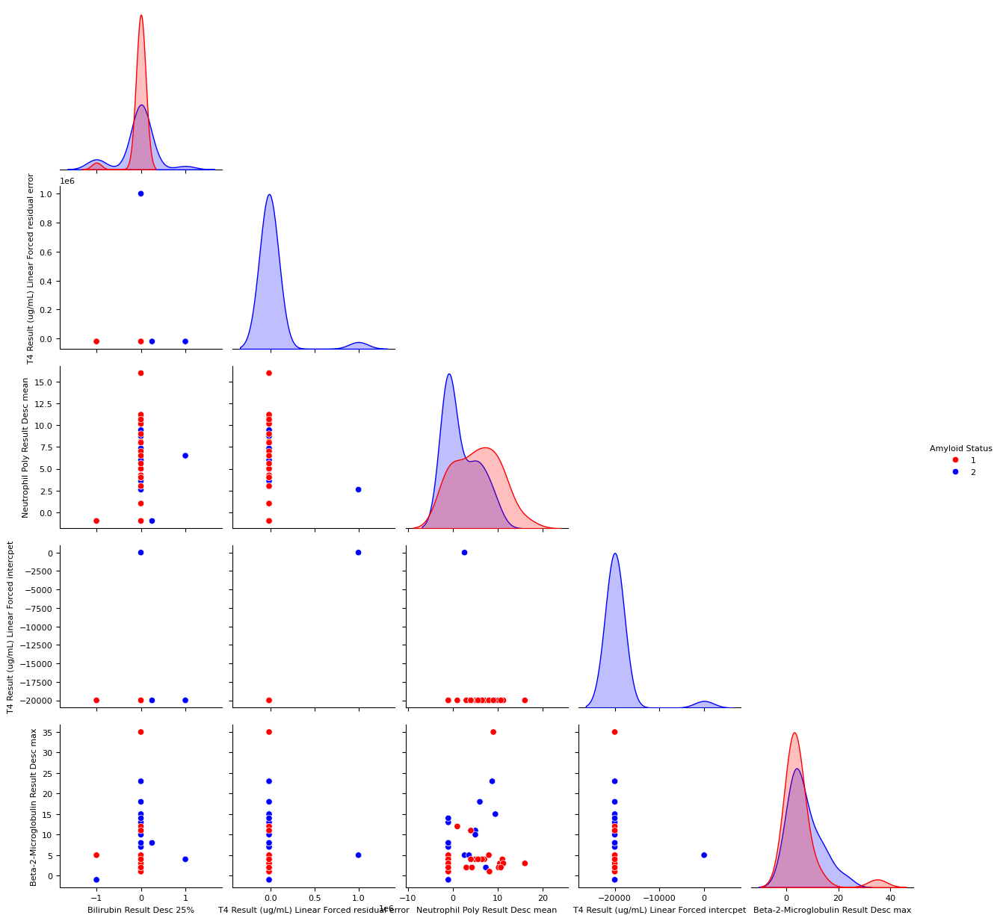

In [144]:
palette = {np.int64(1) :'red', np.int64(2): 'blue'} #our data is of int64
featuresToPlot = list(X.columns[featRank_A["sorted"].astype(int)][0:numb_features_figures])
featuresToPlot.extend([y_column_Classification]) #must include the final classification column 

fig = pairplot(dataTable[featuresToPlot],hue= y_column_Classification, corner=True, palette=palette)
# fig.title("featRank_A compare features")

figCommon = fileName_common + "featRankA"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

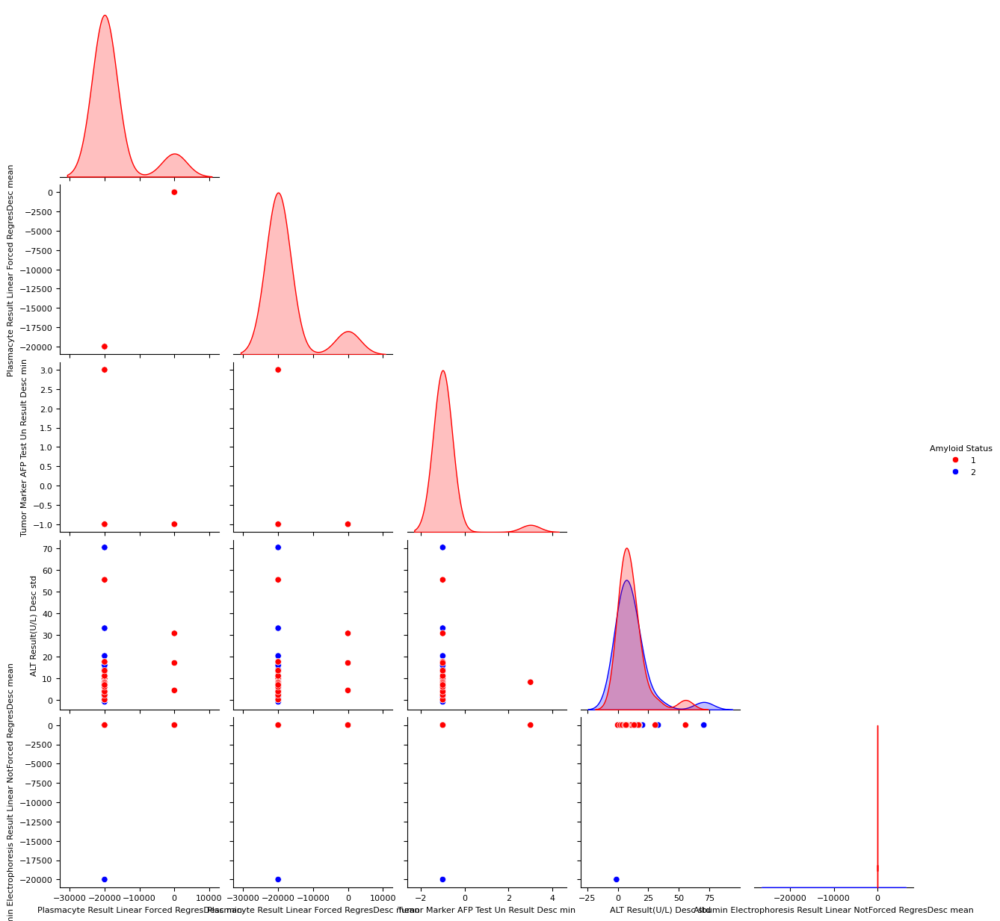

In [145]:
palette = {np.int64(1) :'red', np.int64(2): 'blue'} #our data is of int64
featuresToPlot = list(X.columns[featRank_B["sorted"].astype(int)][0:numb_features_figures])
featuresToPlot.extend([y_column_Classification]) #must include the final classification column 

fig = pairplot(dataTable[featuresToPlot],hue= y_column_Classification, corner=True, palette=palette)
# fig.title("featRank_A 5 features", loc = 'center')

figCommon = fileName_common + "featRankB_5"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

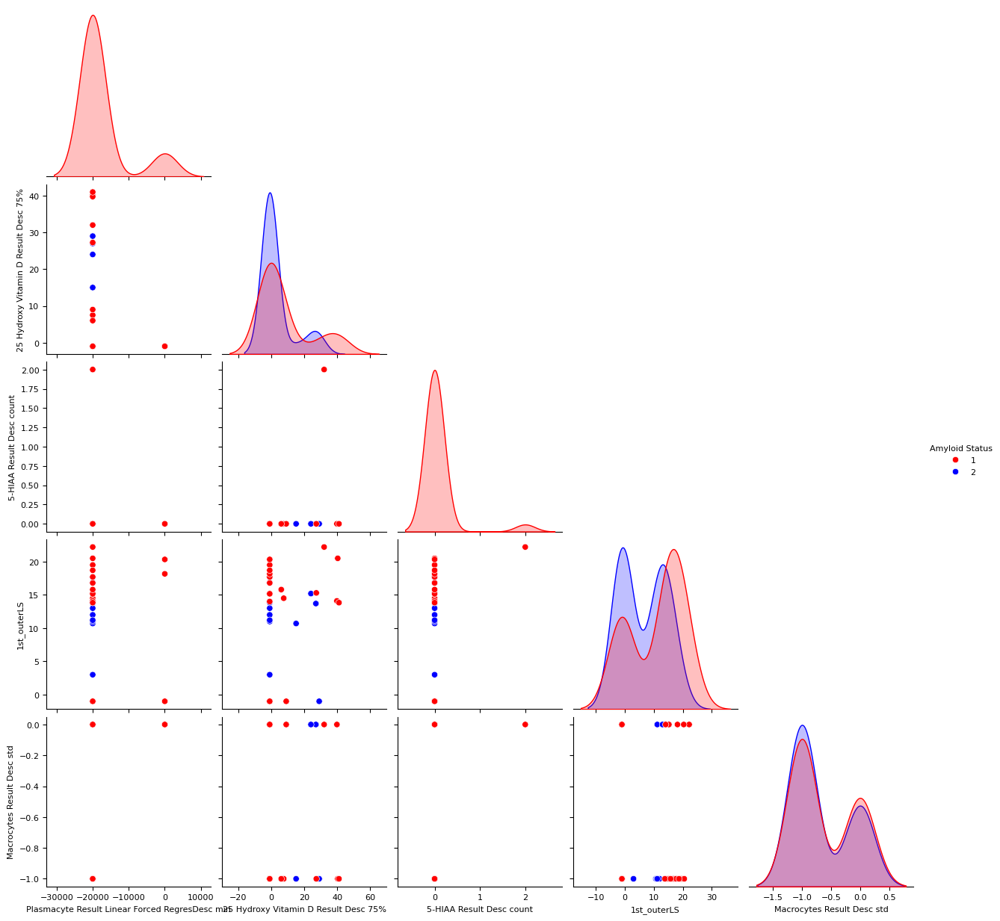

In [146]:
palette = {np.int64(1) :'red', np.int64(2): 'blue'} #our data is of int64
featuresToPlot = list(X.columns[featRank_D["sorted"].astype(int)][0:numb_features_figures])
featuresToPlot.extend([y_column_Classification]) #must include the final classification column 

fig = pairplot(dataTable[featuresToPlot],hue= y_column_Classification, corner=True, palette=palette)
# fig.title("featRank_A 5 features", loc = 'center')

figCommon = fileName_common + "featRankD_5"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

## getting features of best models

In [147]:
modelD_Features = featRank_D["best_features"] #to get the best features which take highest score and highest C
modelD_FeaturesInt = featRank_D["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelD_numbFeatures = len(modelD_FeaturesInt) #number of features

#list of column names
modelD_FeaturesIntList = X.columns[featRank_D["best_features"].astype(int)]
modelE_Features = featRank_E["best_features"] #to get the best features which take highest score and highest C
modelE_FeaturesInt = featRank_E["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelE_numbFeatures = len(modelE_FeaturesInt) #number of features

#list of column names
modelE_FeaturesIntList = X.columns[featRank_E["best_features"].astype(int)]
modelB_Features = featRank_B["best_features"] #to get the best features which take highest score and highest C
modelB_FeaturesInt = featRank_B["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelB_numbFeatures = len(modelB_FeaturesInt) #number of features

#list of column names
modelB_FeaturesIntList = X.columns[featRank_B["best_features"].astype(int)]

### for 0.5 weighting of importance-contribution

modelB_Features = featRank_B["best_features"] #to get the best features which take highest score and highest C
modelB_FeaturesInt = featRank_B["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelB_numbFeatures = len(modelB_FeaturesInt) #number of features

#list of column names
modelB_FeaturesIntList = X.columns[featRank_B["best_features"].astype(int)]

In [148]:
#setting the parameters for the plots below
featuresInt = modelE_FeaturesInt
numbFeatures = modelE_numbFeatures
ListFeatureColNames = modelE_FeaturesIntList

In [149]:
#creation of classifier using the features found in ranking above
#creation of tesTune_075
tesTune05 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range,feature_index=featuresInt)
print(tesTune075["best_params"])

   c         g   f1  auc  score
0  4  0.007812  1.0  1.0    1.0


In [150]:
#pickling tesTune075
pickle_file_name = 'tesTune05_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(tesTune075, pickle_file)

In [151]:
#setting the tuned SVM model for the plots below
tunedModel = tesTune05

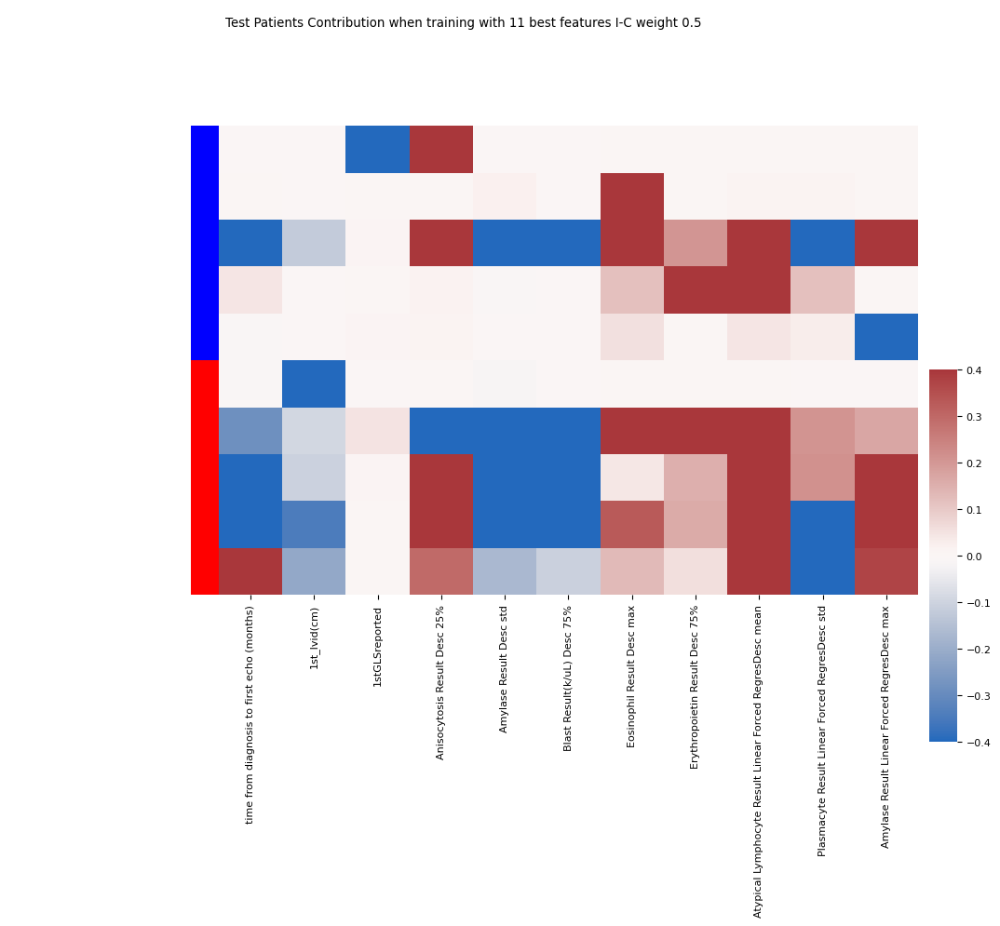

In [152]:
#feature contribution plot using only the test data
feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets[fold]["test"]["X"][:,featuresInt])
FItable = pd.DataFrame(feat_contribution, index=CV_sets[fold]["test"]["y"],columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:], 
           yticklabels=False,
           cmap="vlag", vmin=-0.4, vmax=0.4,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets[0]["test"]["y"].values[np.argsort(CV_sets[fold]["test"]["y"].values)]])
plt.suptitle("Test Patients Contribution when training with "+  str(numbFeatures)+ " best features I-C weight 0.5")

figCommon = fileName_common + "fig3_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

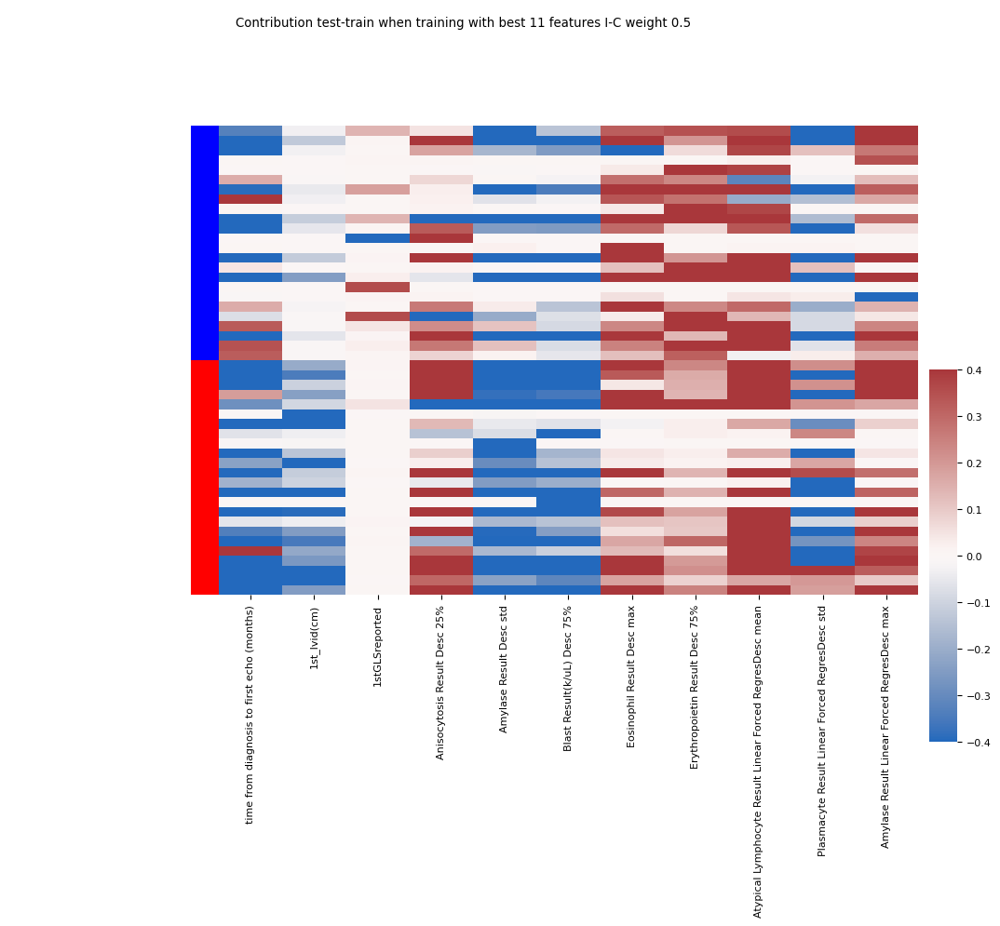

In [153]:
#feature contribution cluster map for all test and train patients
CV_sets_trainANDtest_X = np.concatenate((CV_sets[fold]["train"]["X"][:,featuresInt],CV_sets[fold]["test"]["X"][:,featuresInt]), axis =0)
CV_sets_trainANDtest_y = np.concatenate((CV_sets[fold]["train"]["y"],CV_sets[fold]["test"]["y"]), axis = 0)

feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets_trainANDtest_X)
FItable = pd.DataFrame(feat_contribution, index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           cmap="vlag", vmin=-0.4, vmax=0.4,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Contribution test-train when training with best "+  str(numbFeatures)+ " features I-C weight 0.5")

figCommon = fileName_common + "fig3_2_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

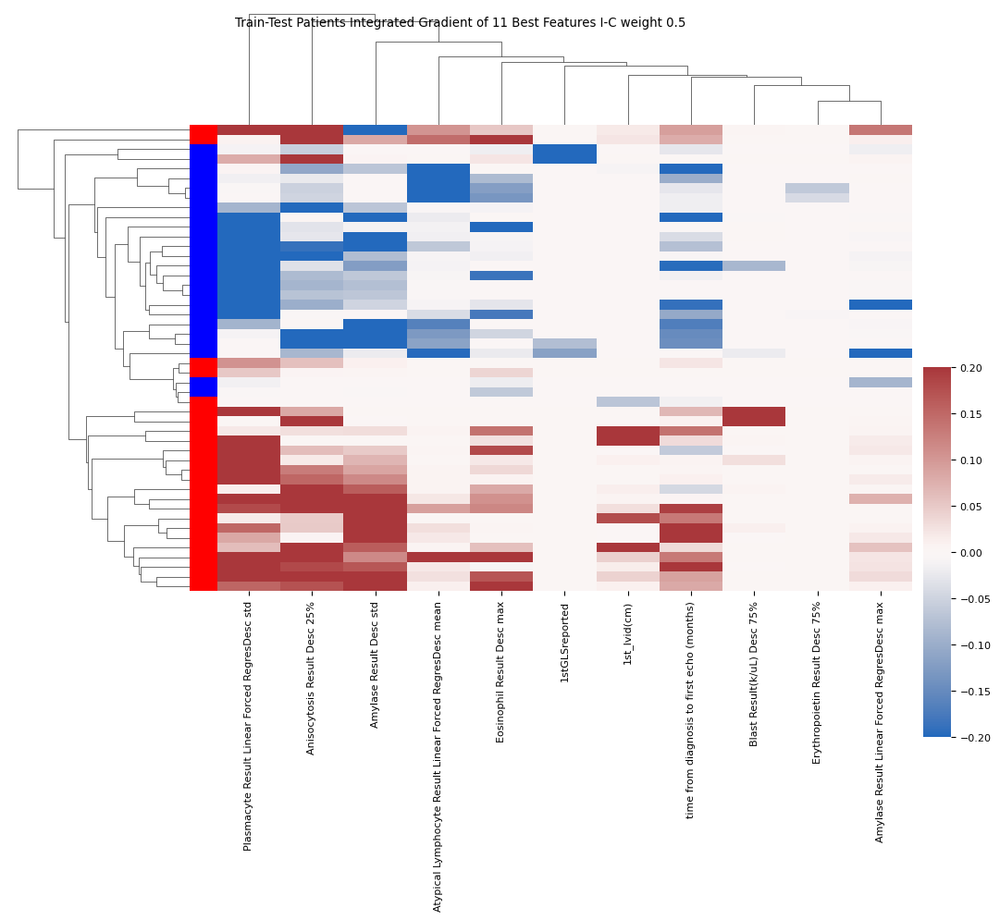

In [154]:
#integrated gradient cluster map with heigharchical clustering

IG = compute_SV_integrated_gradient(tunedModel["best_models"][fold], CV_sets_trainANDtest_X)

IGtable = pd.DataFrame(IG,columns=ListFeatureColNames)

fig = clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-0.2, vmax=0.2,
           #row_linkage=hcRow, col_linkage=hcCol, 
           cbar_pos=(1, .2, .03, .4),
        #    row_colors=[["red","blue"][int(l=="B")+0] for l in CV_sets[0]["test"]["y"].values]
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y])
plt.suptitle("Train-Test Patients Integrated Gradient of "+  str(numbFeatures)+ " Best Features I-C weight 0.5")
plt.show()

figCommon = fileName_common + "fig4_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

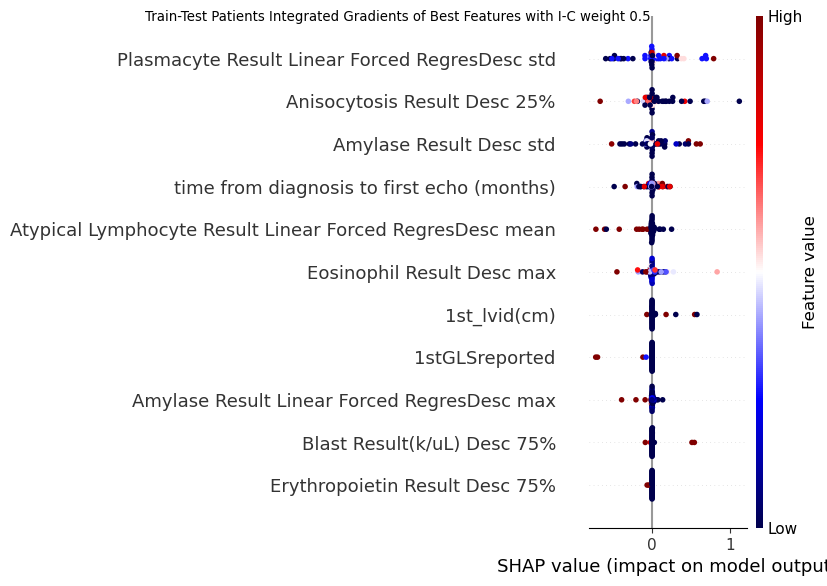

In [155]:
#shap plot for integrated gradients
fig = shap.summary_plot(IG,  CV_sets_trainANDtest_X, max_display=numbFeatures , 
                  feature_names=ListFeatureColNames,cmap="seismic", show = False)
plt.suptitle("Train-Test Patients Integrated Gradients of Best Features with I-C weight 0.5")
figCommon = fileName_common + "fig5_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

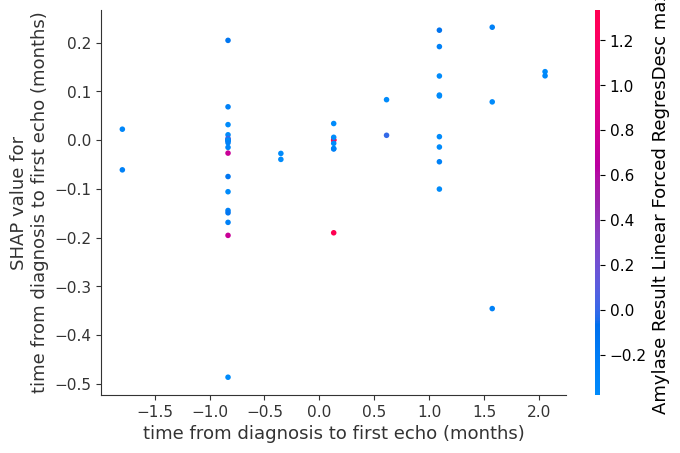

In [156]:
#shap dependence plot
Xcv = pd.DataFrame(CV_sets_trainANDtest_X, 
                     index=CV_sets_trainANDtest_y,
                     columns=ListFeatureColNames)

fig6_feature_to_plot= ListFeatureColNames[0]

shap.dependence_plot( fig6_feature_to_plot , IG, Xcv, show = False)

figCommon = fileName_common + "fig6_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

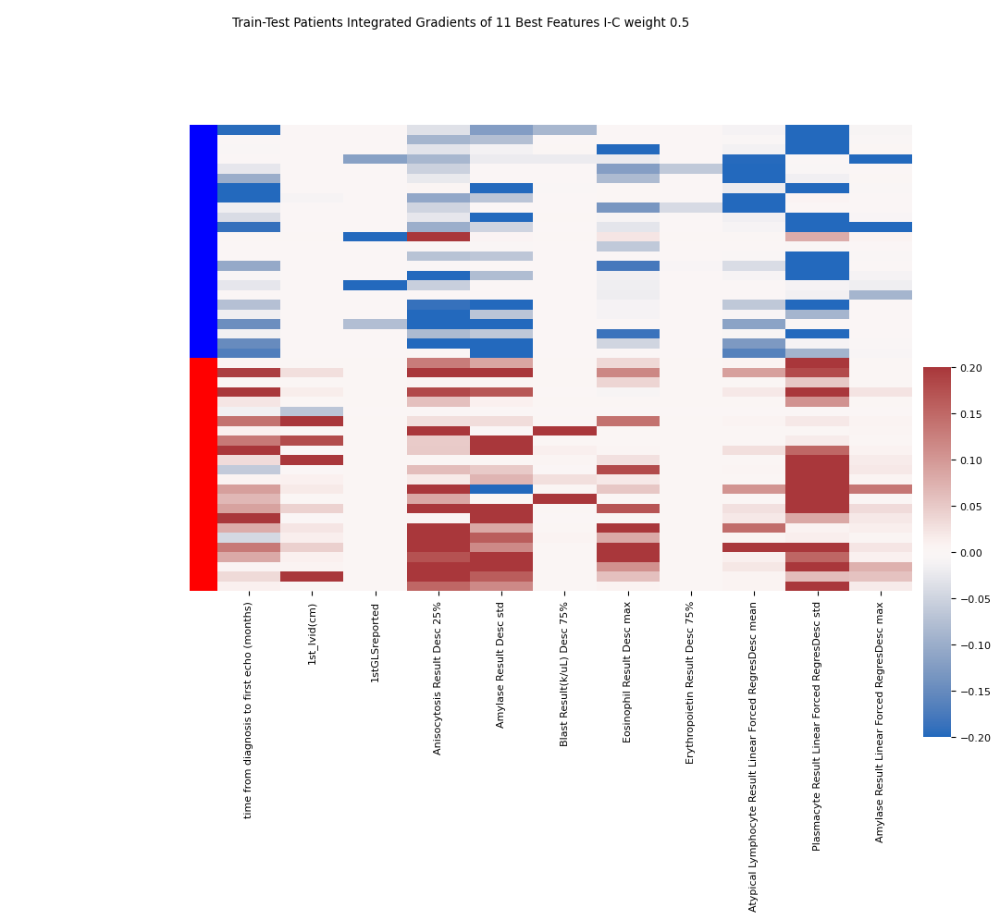

In [157]:
#cluster map of integrated gradients sorted by index
IGtable_wIndex = pd.DataFrame(IG, index=CV_sets_trainANDtest_y, columns=ListFeatureColNames)

IGtable_wIndex.reset_index(drop=True, inplace=True)
fig = clustermap(IGtable_wIndex.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-0.2, vmax=0.2,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])

plt.suptitle("Train-Test Patients Integrated Gradients of "+ str(numbFeatures) +' Best Features I-C weight 0.5')
plt.show()

figCommon = fileName_common + "fig7_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

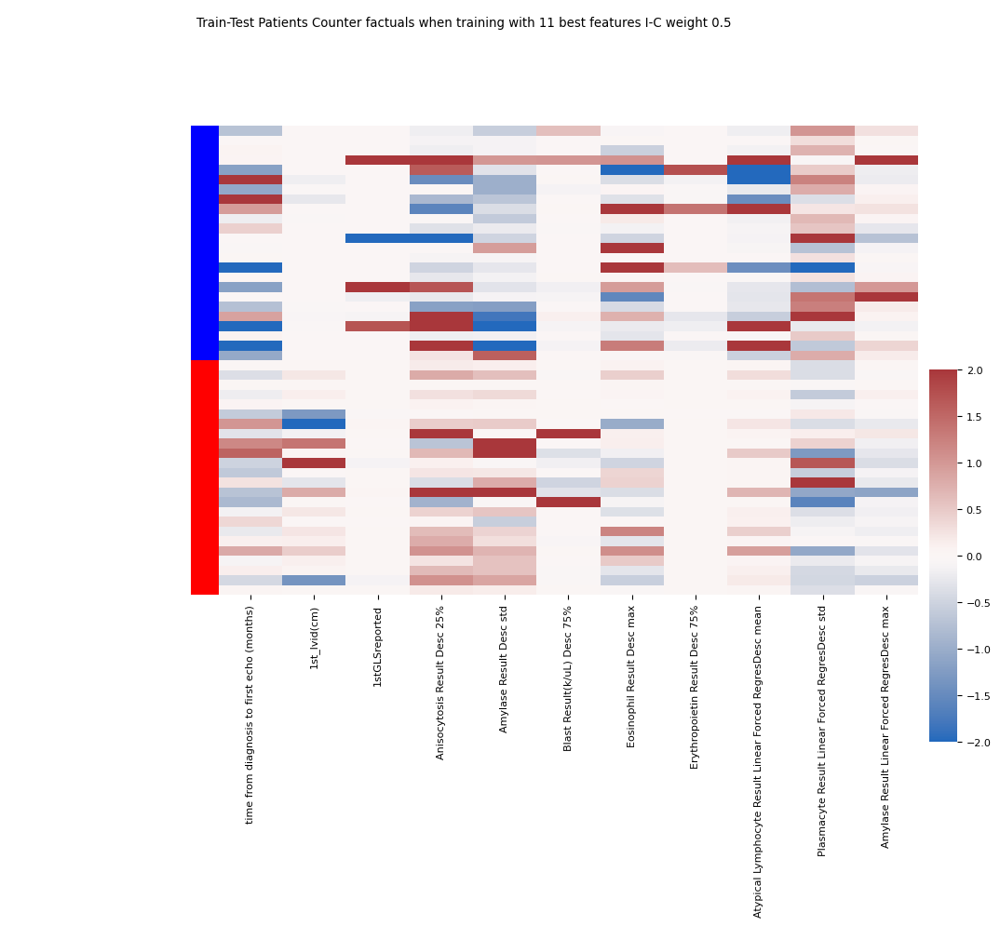

In [158]:
#counter factuals map
counterfactuals = compute_counterfactuals(tunedModel["best_models"][fold], 
                                          CV_sets_trainANDtest_X)
CFtable = pd.DataFrame(counterfactuals, 
                       index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

CFtable.reset_index(drop=True, inplace=True)
fig = clustermap(CFtable.iloc[np.argsort(CV_sets_trainANDtest_y),:],#/abs(Xtop3.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:]), 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-2, vmax=2,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Train-Test Patients Counter factuals when training with "+ str(numbFeatures) +' best features I-C weight 0.5')
# plt.show()

figCommon = fileName_common + "fig9_w05"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

### hyperparameter tuning for best features of 0.75 weighting

In [159]:
modelE_Features = featRank_E["best_features"] #to get the best features which take highest score and highest C
modelE_FeaturesInt = featRank_E["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelE_numbFeatures = len(modelE_FeaturesInt) #number of features

#list of column names
modelE_FeaturesIntList = X.columns[featRank_E["best_features"].astype(int)]

In [160]:
#setting the parameters for the plots below
featuresInt = modelE_FeaturesInt
numbFeatures = modelE_numbFeatures
ListFeatureColNames = modelE_FeaturesIntList

In [161]:
#creation of classifier using the features found in ranking above
#creation of tesTune_075
tesTune075 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range,feature_index=featuresInt)
print(tesTune075["best_params"])

   c     g        f1  auc     score
0  4  0.25  0.933333  1.0  0.966667


In [162]:
#pickling tesTune075
pickle_file_name = 'tesTune075_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(tesTune075, pickle_file)

In [163]:
#setting the tuned SVM model for the plots below
tunedModel = tesTune075

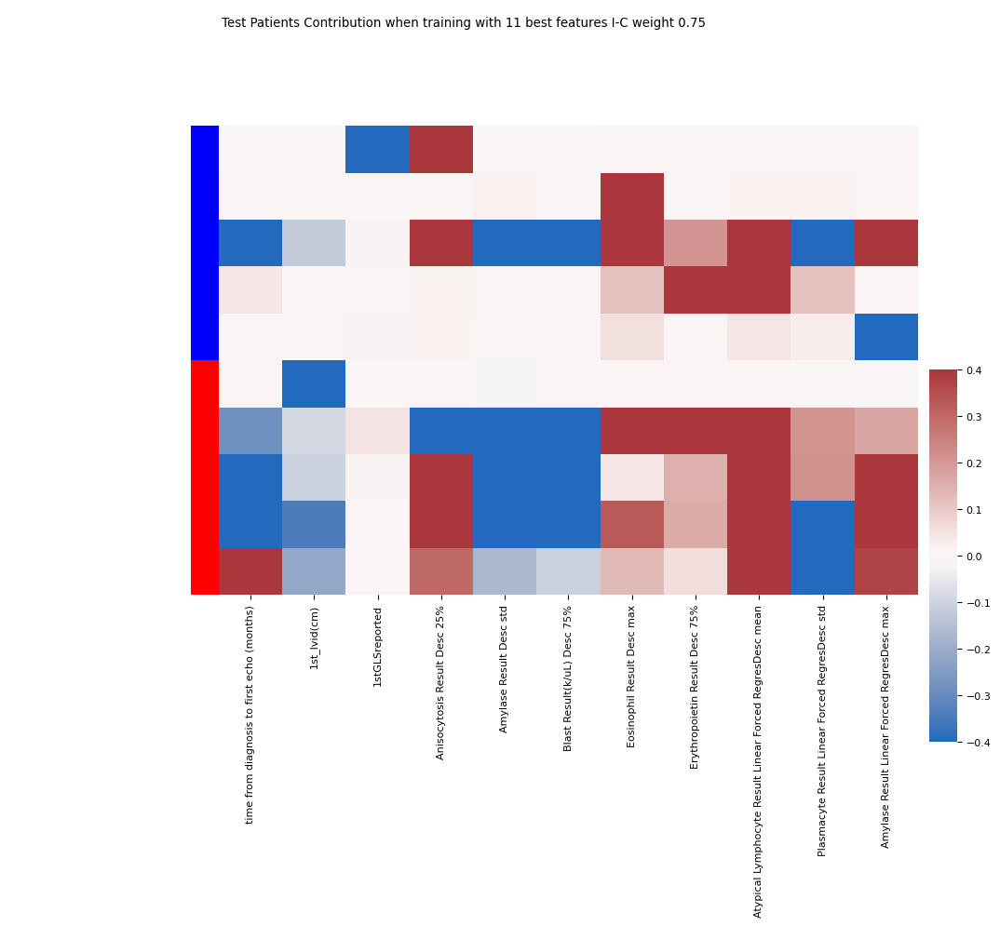

In [164]:
#feature contribution plot using only the test data
feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets[fold]["test"]["X"][:,featuresInt])
FItable = pd.DataFrame(feat_contribution, index=CV_sets[fold]["test"]["y"],columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:], 
           yticklabels=False,
           cmap="vlag", vmin=-0.4, vmax=0.4,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets[0]["test"]["y"].values[np.argsort(CV_sets[fold]["test"]["y"].values)]])
plt.suptitle("Test Patients Contribution when training with "+  str(numbFeatures)+ " best features I-C weight 0.75")

figCommon = fileName_common + "fig3_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

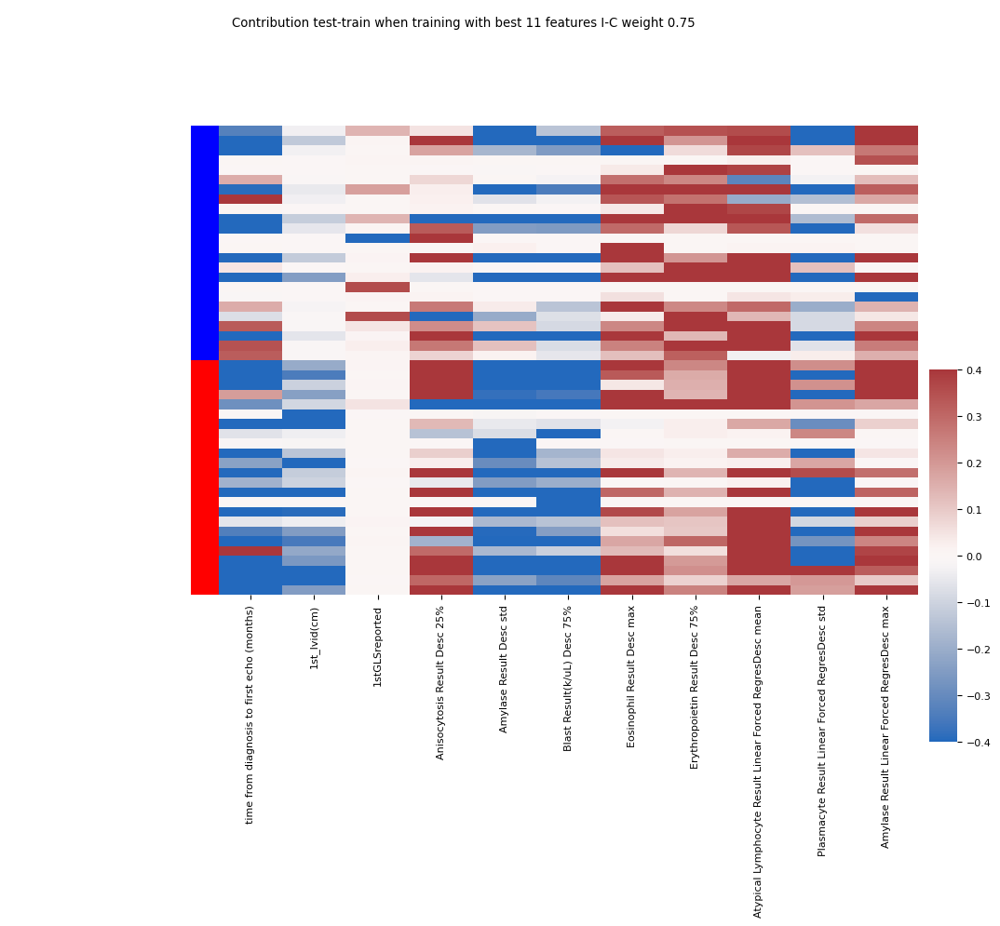

In [165]:
#feature contribution cluster map for all test and train patients
CV_sets_trainANDtest_X = np.concatenate((CV_sets[fold]["train"]["X"][:,featuresInt],CV_sets[fold]["test"]["X"][:,featuresInt]), axis =0)
CV_sets_trainANDtest_y = np.concatenate((CV_sets[fold]["train"]["y"],CV_sets[fold]["test"]["y"]), axis = 0)

feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets_trainANDtest_X)
FItable = pd.DataFrame(feat_contribution, index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           cmap="vlag", vmin=-0.4, vmax=0.4,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Contribution test-train when training with best "+  str(numbFeatures)+ " features I-C weight 0.75")

figCommon = fileName_common + "fig3_2_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

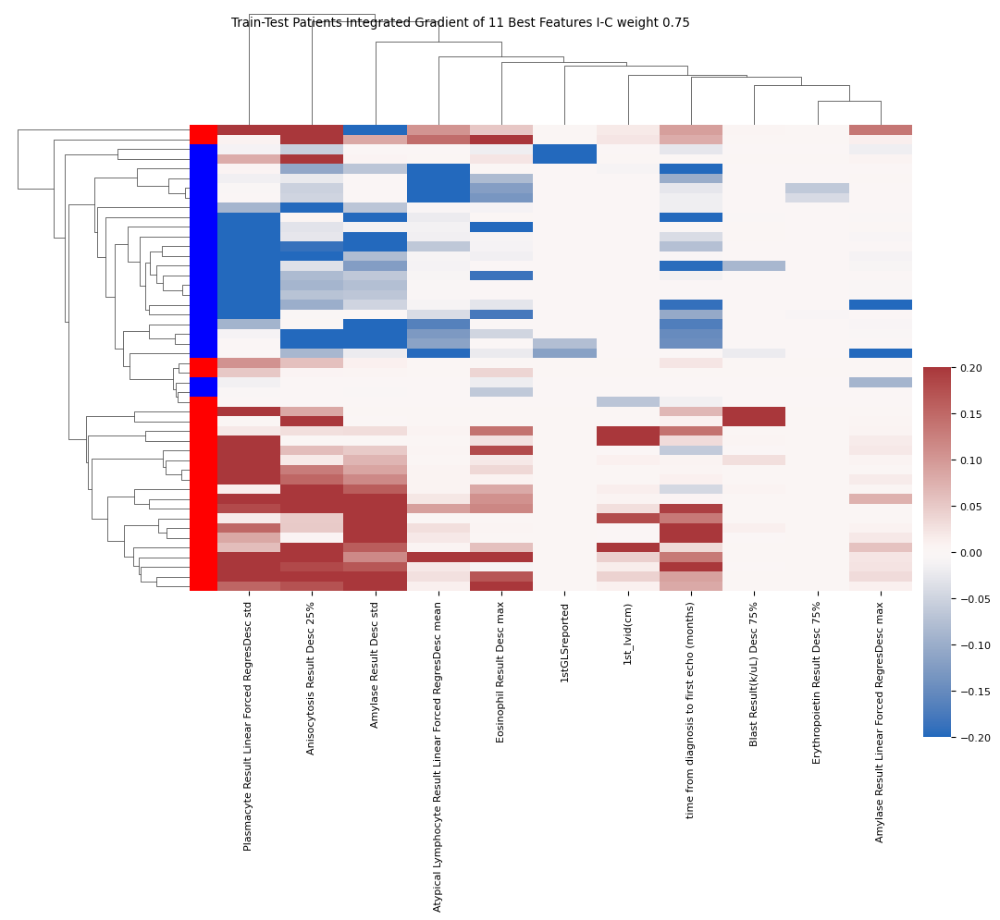

In [166]:
#integrated gradient cluster map with heigharchical clustering

IG = compute_SV_integrated_gradient(tunedModel["best_models"][fold], CV_sets_trainANDtest_X)

IGtable = pd.DataFrame(IG,columns=ListFeatureColNames)

fig = clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-0.2, vmax=0.2,
           #row_linkage=hcRow, col_linkage=hcCol, 
           cbar_pos=(1, .2, .03, .4),
        #    row_colors=[["red","blue"][int(l=="B")+0] for l in CV_sets[0]["test"]["y"].values]
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y])
plt.suptitle("Train-Test Patients Integrated Gradient of "+  str(numbFeatures)+ " Best Features I-C weight 0.75")
plt.show()

figCommon = fileName_common + "fig4_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

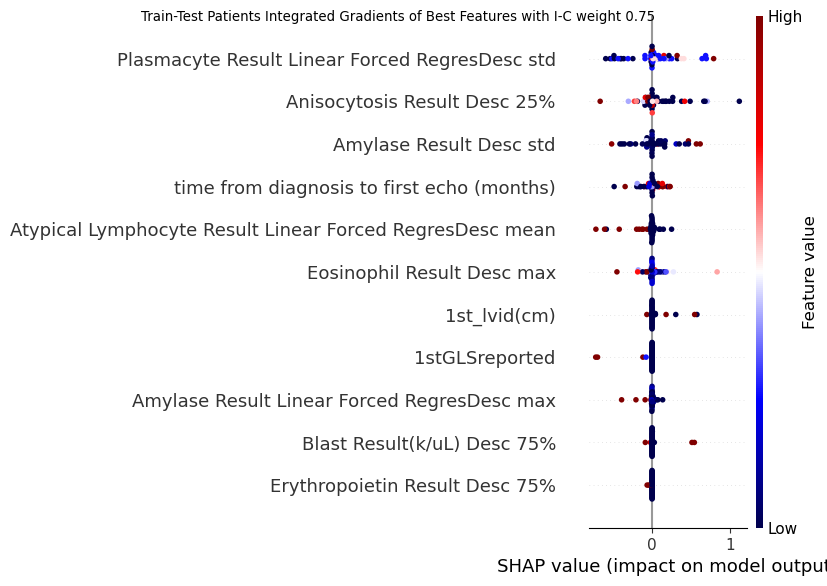

In [167]:
#shap plot for integrated gradients
fig = shap.summary_plot(IG,  CV_sets_trainANDtest_X, max_display=numbFeatures , 
                  feature_names=ListFeatureColNames,cmap="seismic", show = False)
plt.suptitle("Train-Test Patients Integrated Gradients of Best Features with I-C weight 0.75")
figCommon = fileName_common + "fig5_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

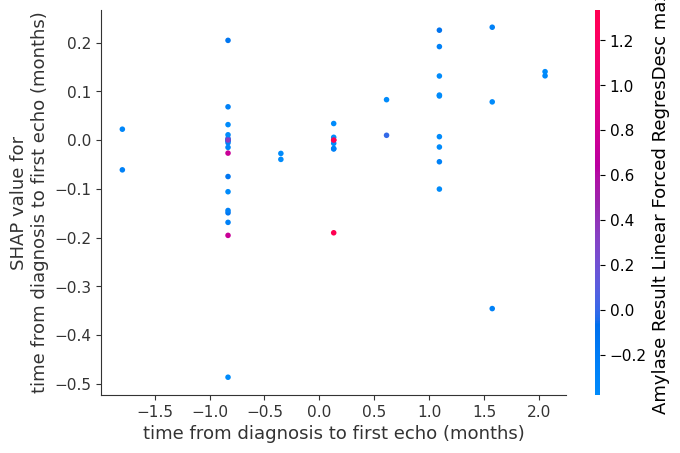

In [168]:
#shap dependence plot
Xcv = pd.DataFrame(CV_sets_trainANDtest_X, 
                     index=CV_sets_trainANDtest_y,
                     columns=ListFeatureColNames)

fig6_feature_to_plot= ListFeatureColNames[0]

shap.dependence_plot( fig6_feature_to_plot , IG, Xcv, show = False)

figCommon = fileName_common + "fig6_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

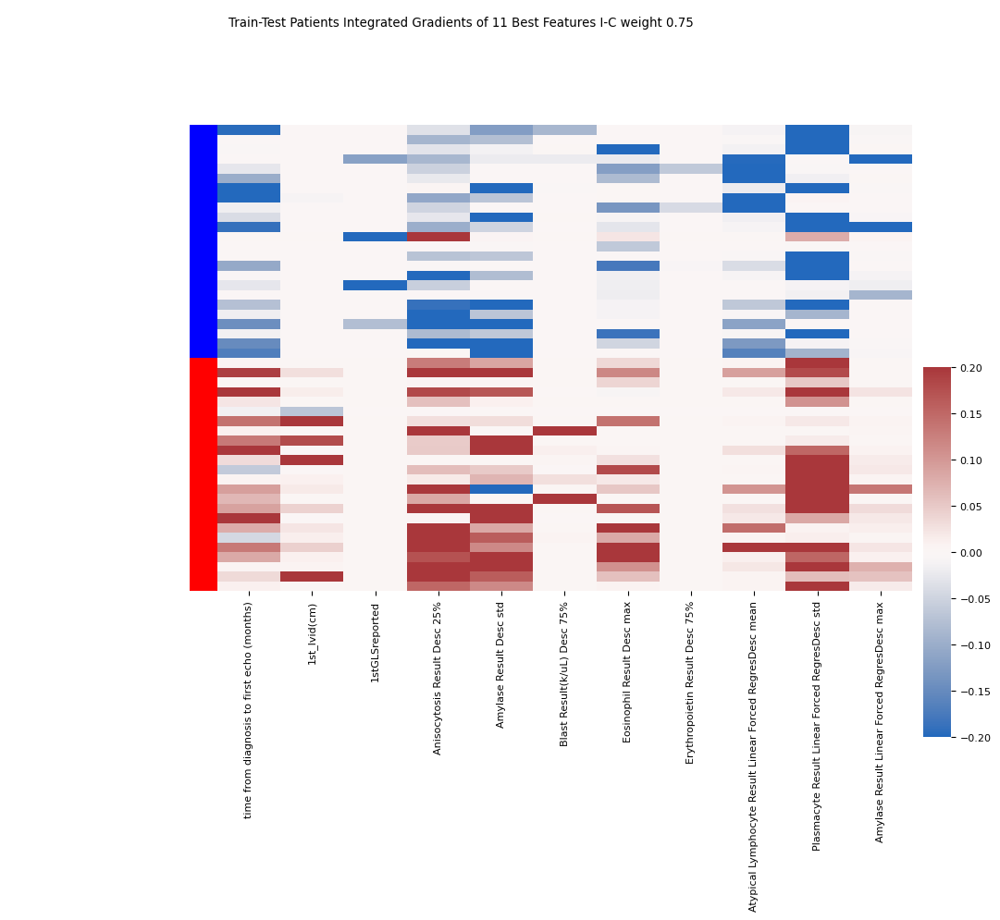

In [169]:
#cluster map of integrated gradients sorted by index
IGtable_wIndex = pd.DataFrame(IG, index=CV_sets_trainANDtest_y, columns=ListFeatureColNames)

IGtable_wIndex.reset_index(drop=True, inplace=True)
fig = clustermap(IGtable_wIndex.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-0.2, vmax=0.2,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])

plt.suptitle("Train-Test Patients Integrated Gradients of "+ str(numbFeatures) +' Best Features I-C weight 0.75')
plt.show()

figCommon = fileName_common + "fig7_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

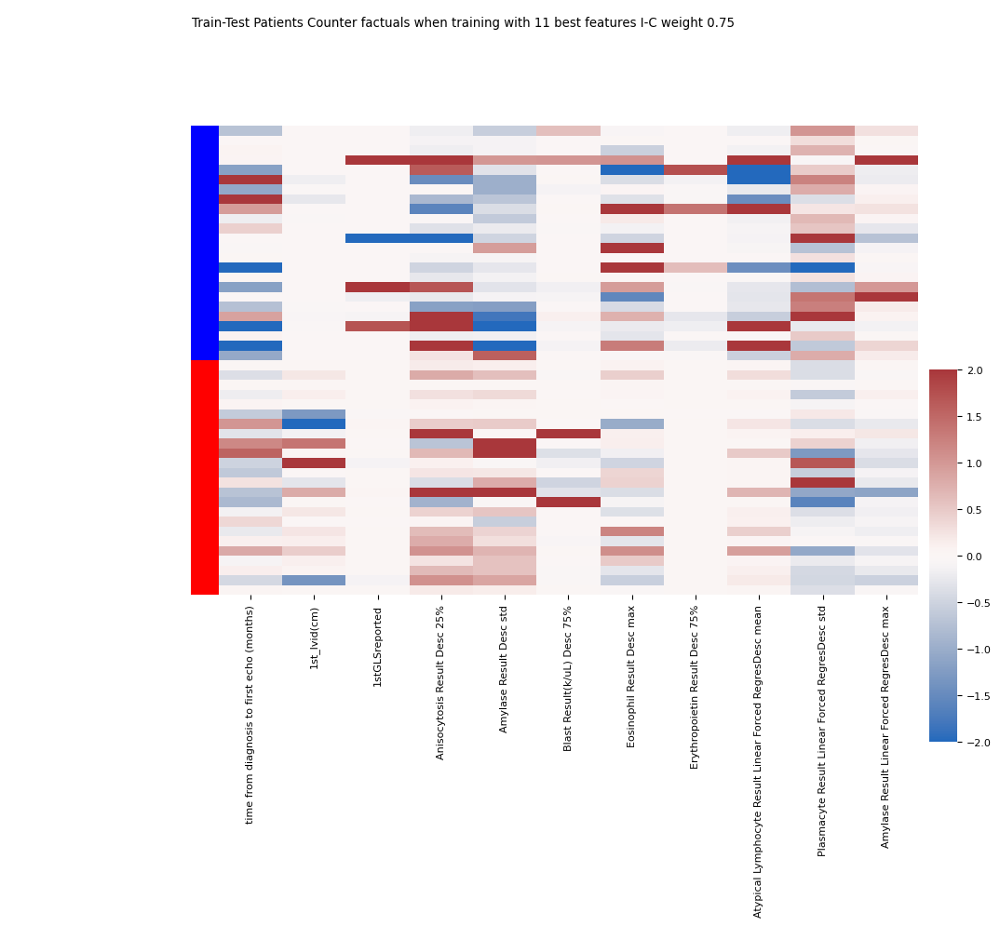

In [170]:
#counter factuals map
counterfactuals = compute_counterfactuals(tunedModel["best_models"][fold], 
                                          CV_sets_trainANDtest_X)
CFtable = pd.DataFrame(counterfactuals, 
                       index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

CFtable.reset_index(drop=True, inplace=True)
fig = clustermap(CFtable.iloc[np.argsort(CV_sets_trainANDtest_y),:],#/abs(Xtop3.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:]), 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-2, vmax=2,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Train-Test Patients Counter factuals when training with "+ str(numbFeatures) +' best features I-C weight 0.75')
# plt.show()

figCommon = fileName_common + "fig9_w075"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

### hyperparameter tuning using list of best features from feature selection using only contribution

In [171]:
modelB_Features = featRank_B["best_features"] #to get the best features which take highest score and highest C
modelB_FeaturesInt = featRank_B["best_features"].astype(int) #convert these to ints? to use as column finding for x.columns?
modelB_numbFeatures = len(modelB_FeaturesInt) #number of features

#list of column names
modelB_FeaturesIntList = X.columns[featRank_B["best_features"].astype(int)]

In [172]:
#setting the parameters for the plots below
featuresInt = modelB_FeaturesInt
numbFeatures = modelB_numbFeatures
ListFeatureColNames = modelB_FeaturesIntList

In [173]:
#creation of classifier using the features found in ranking above
#creation of tesTune_1
tesTune100 = tuneSVM(svc, CV_sets, score_method = svc_score().score, costs = C_range, gammas = gamma_range,feature_index=featuresInt)
print(tesTune100["best_params"])

   c         g        f1  auc     score
0  2  0.015625  0.977778  1.0  0.988889


In [174]:
#pickling tesTune100
pickle_file_name = 'tesTune100_object_' + fileName_header +fileName_suffix
pickle_filePath = os.path.join(saving_dirrectory, pickleFolderOut, pickle_file_name)
pickle_file = open(pickle_filePath, 'wb')
pickle.dump(tesTune100, pickle_file)

In [175]:
#setting the tuned SVM model for the plots below
tunedModel = tesTune100

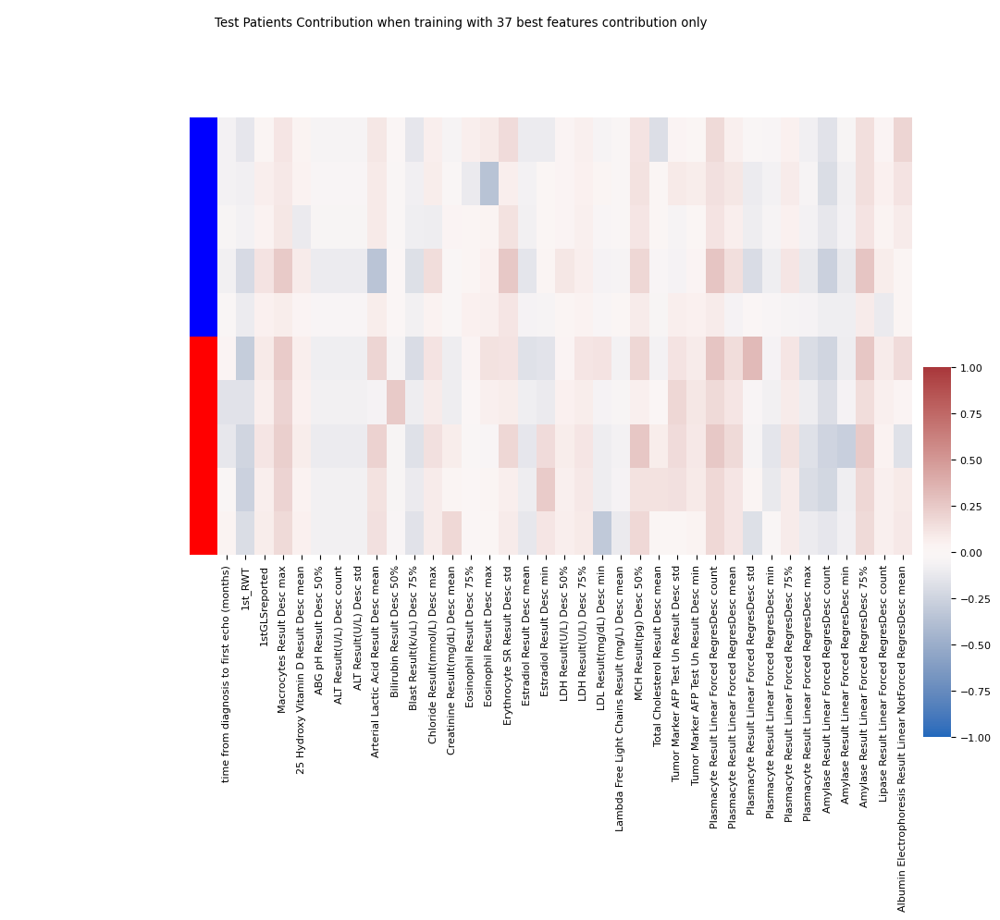

In [176]:
#feature contribution plot using only the test data
feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets[fold]["test"]["X"][:,featuresInt])
FItable = pd.DataFrame(feat_contribution, index=CV_sets[fold]["test"]["y"],columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:], 
           yticklabels=False,
           cmap="vlag", vmin=-1, vmax=1,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets[0]["test"]["y"].values[np.argsort(CV_sets[fold]["test"]["y"].values)]])
plt.suptitle("Test Patients Contribution when training with "+  str(numbFeatures)+ " best features contribution only")

figCommon = fileName_common + "fig3_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

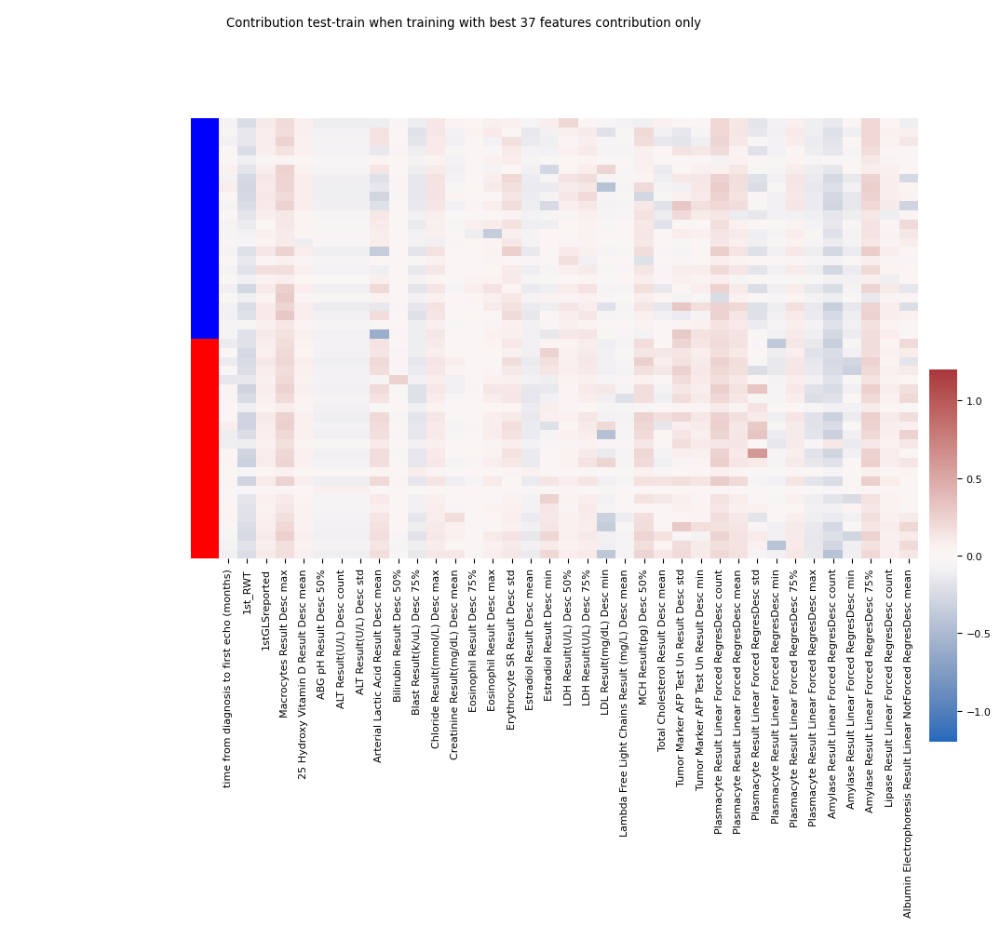

In [177]:
#feature contribution cluster map for all test and train patients
CV_sets_trainANDtest_X = np.concatenate((CV_sets[fold]["train"]["X"][:,featuresInt],CV_sets[fold]["test"]["X"][:,featuresInt]), axis =0)
CV_sets_trainANDtest_y = np.concatenate((CV_sets[fold]["train"]["y"],CV_sets[fold]["test"]["y"]), axis = 0)

feat_contribution = compute_SV_decision_perturbation(tunedModel["best_models"][fold],CV_sets_trainANDtest_X)
FItable = pd.DataFrame(feat_contribution, index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

FItable.reset_index(drop=True, inplace=True)
fig = clustermap(FItable.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           cmap="vlag", vmin=-1.2, vmax=1.2,
           #row_linkage=hcRow, col_linkage=hcCol, 
           row_cluster=False,col_cluster=False,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Contribution test-train when training with best "+  str(numbFeatures)+ " features contribution only")

figCommon = fileName_common + "fig3_2_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

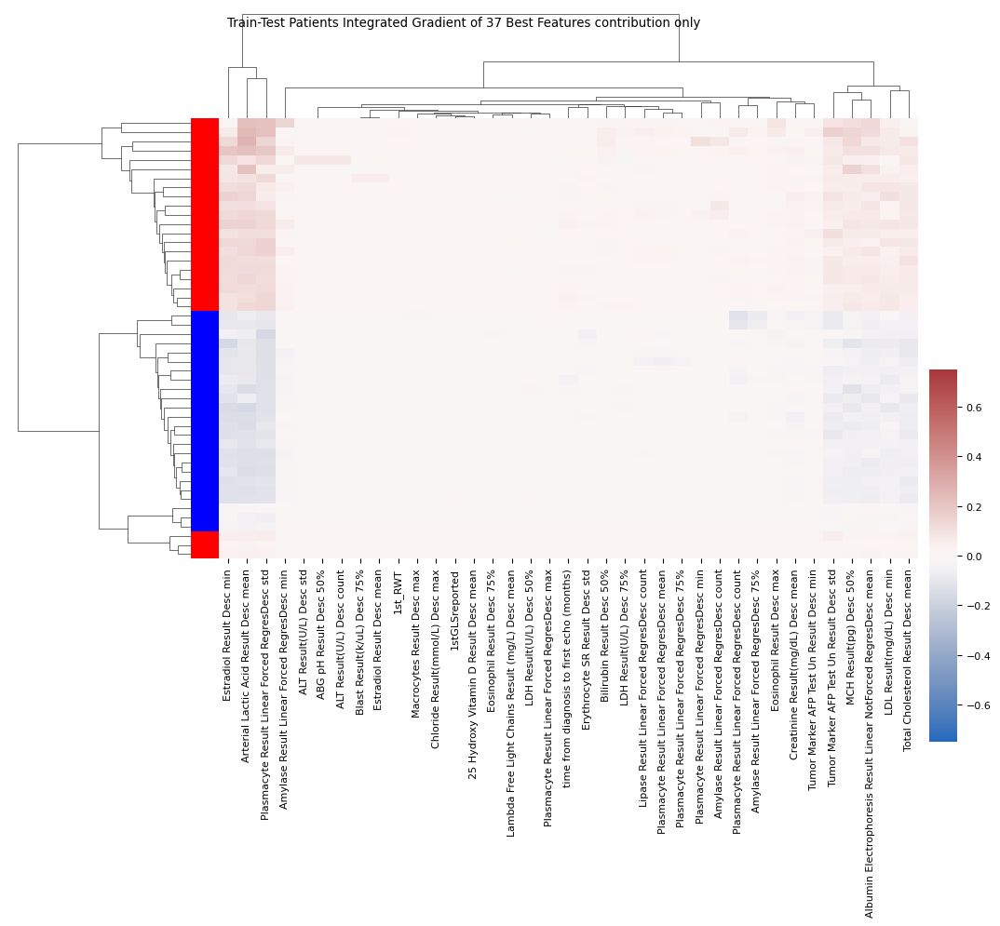

In [178]:
#integrated gradient cluster map with heigharchical clustering

IG = compute_SV_integrated_gradient(tunedModel["best_models"][fold], CV_sets_trainANDtest_X)

IGtable = pd.DataFrame(IG,columns=ListFeatureColNames)

fig = clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-0.75, vmax=0.75,
           #row_linkage=hcRow, col_linkage=hcCol, 
           cbar_pos=(1, .2, .03, .4),
        #    row_colors=[["red","blue"][int(l=="B")+0] for l in CV_sets[0]["test"]["y"].values]
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y])
plt.suptitle("Train-Test Patients Integrated Gradient of "+  str(numbFeatures)+ " Best Features contribution only")
plt.show()

figCommon = fileName_common + "fig4_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

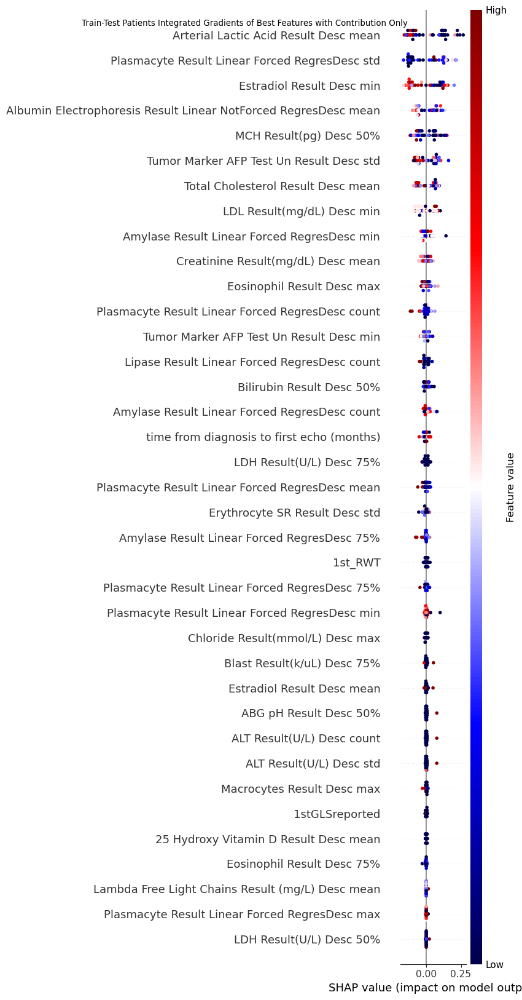

In [179]:
#shap plot for integrated gradients
fig = shap.summary_plot(IG,  CV_sets_trainANDtest_X, max_display=numbFeatures , 
                  feature_names=ListFeatureColNames,cmap="seismic", show = False)
plt.suptitle("Train-Test Patients Integrated Gradients of Best Features with Contribution Only")
figCommon = fileName_common + "fig5_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

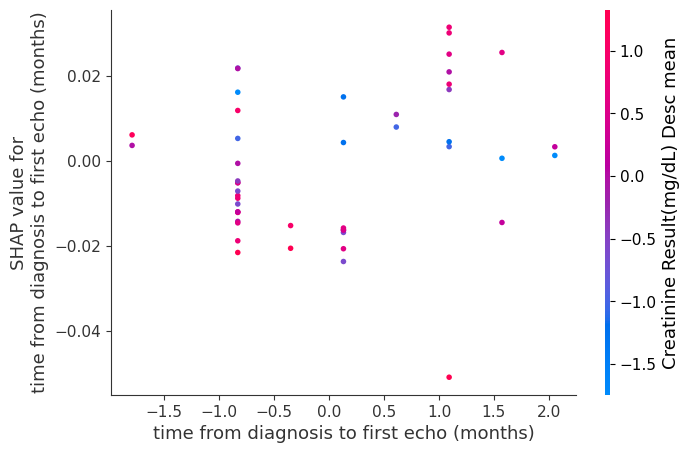

In [180]:
#shap dependence plot
Xcv = pd.DataFrame(CV_sets_trainANDtest_X, 
                     index=CV_sets_trainANDtest_y,
                     columns=ListFeatureColNames)

fig6_feature_to_plot= ListFeatureColNames[0]

shap.dependence_plot( fig6_feature_to_plot , IG, Xcv, show = False)

figCommon = fileName_common + "fig6_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
plt.savefig(figPath, bbox_inches = 'tight')

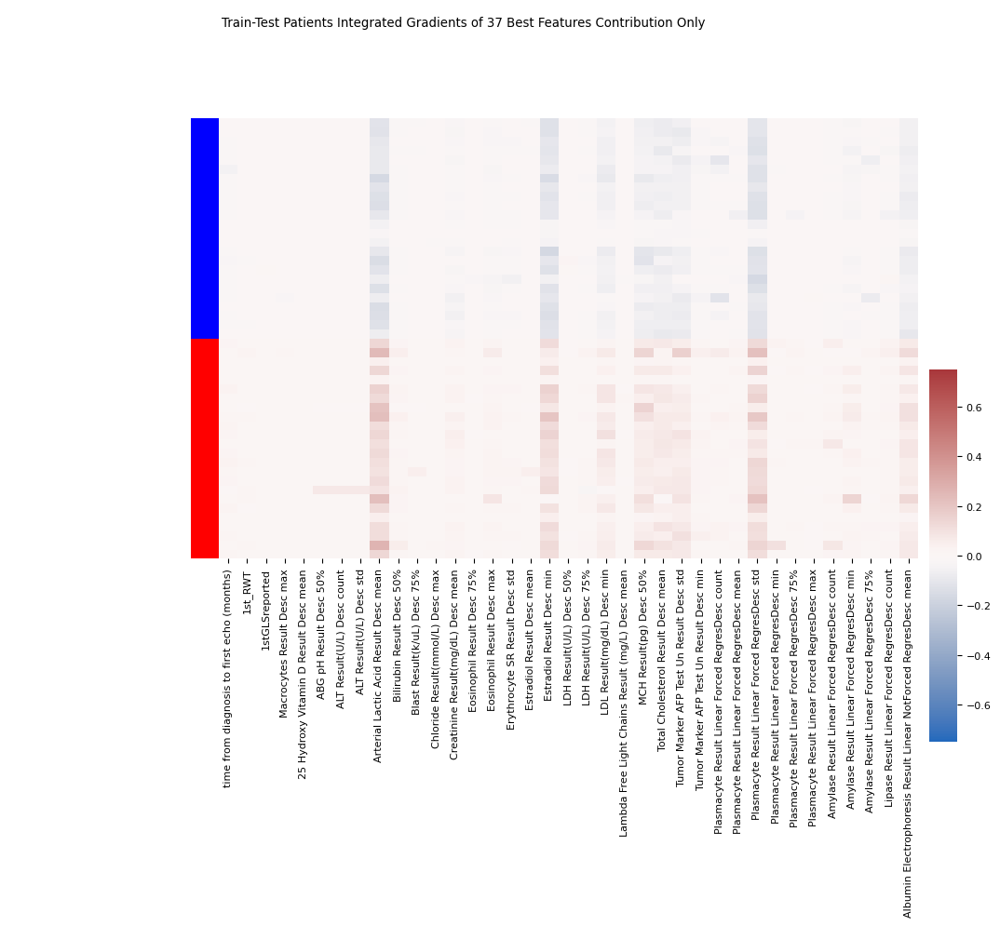

In [181]:
#cluster map of integrated gradients sorted by index
IGtable_wIndex = pd.DataFrame(IG, index=CV_sets_trainANDtest_y, columns=ListFeatureColNames)

IGtable_wIndex.reset_index(drop=True, inplace=True)
fig = clustermap(IGtable_wIndex.iloc[np.argsort(CV_sets_trainANDtest_y),:], 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-0.75, vmax=0.75,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])

plt.suptitle("Train-Test Patients Integrated Gradients of "+ str(numbFeatures) +' Best Features Contribution Only')
plt.show()

figCommon = fileName_common + "fig7_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')

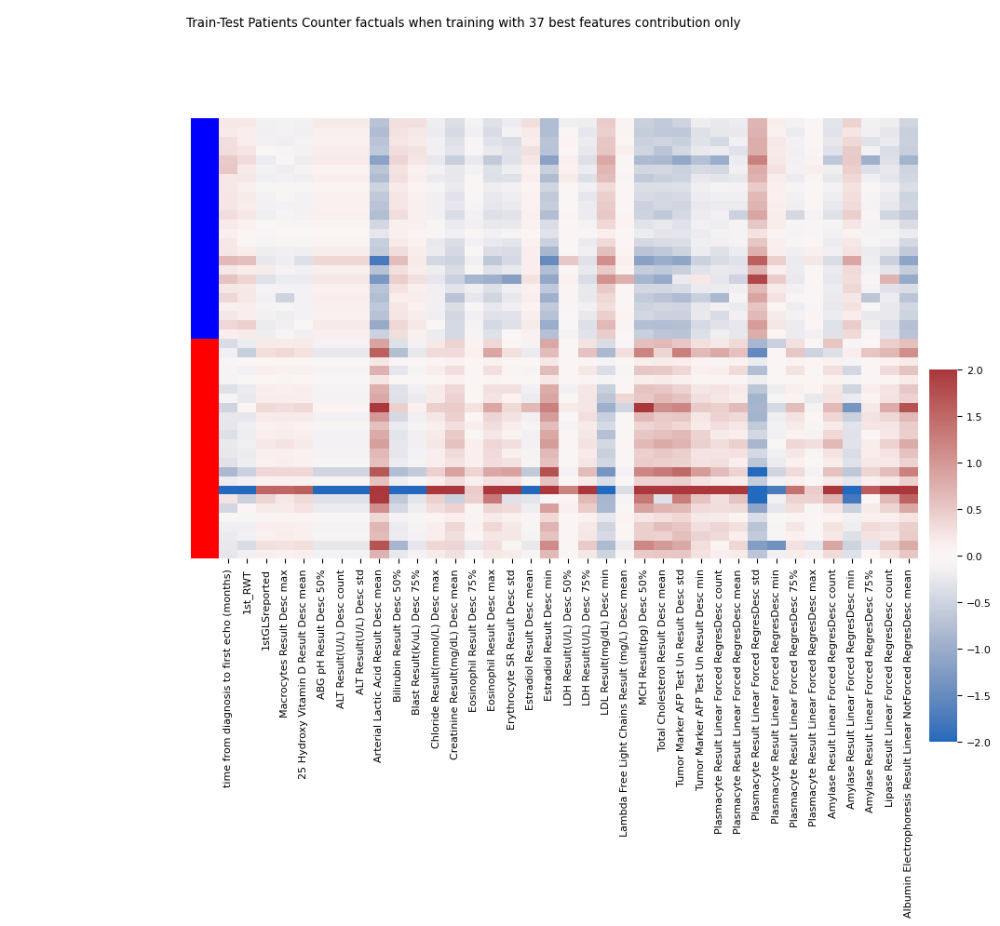

In [182]:
#counter factuals map
counterfactuals = compute_counterfactuals(tunedModel["best_models"][fold], 
                                          CV_sets_trainANDtest_X)
CFtable = pd.DataFrame(counterfactuals, 
                       index=CV_sets_trainANDtest_y,columns=ListFeatureColNames)

CFtable.reset_index(drop=True, inplace=True)
fig = clustermap(CFtable.iloc[np.argsort(CV_sets_trainANDtest_y),:],#/abs(Xtop3.iloc[np.argsort(CV_sets[fold]["test"]["y"].values),:]), 
           yticklabels=False,
           col_cluster=False,
           row_cluster=False,
           cmap="vlag", vmin=-2, vmax=2,
           cbar_pos=(1, .2, .03, .4),
           row_colors=[["red","blue"][int(l==np.int64(1))+0] for l in CV_sets_trainANDtest_y[np.argsort(CV_sets_trainANDtest_y)]])
plt.suptitle("Train-Test Patients Counter factuals when training with "+ str(numbFeatures) +' best features contribution only')
# plt.show()

figCommon = fileName_common + "fig9_w100"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
fig.savefig(figPath, bbox_inches = 'tight')